# Reproducing Hakim CDA Study (2019)
## Pipeline for all files

Note: No cleaning, no trial nor subject removal. All data is taken/used.
Note: They average differently in their study. They average all good contra trials over electrode and then substract contra - ipsi. I substract electrodes and then average over trials.  

In [1]:
import numpy as np
import glob
import pickle
import pandas as pd

import mne
from mne import Epochs, pick_channels, find_events
from mne.io import read_raw_brainvision

import sys
#sys.path.append('/Users/nick/Documents/PhD/CLCT/reprod/studies/')
sys.path.append('D:\\PhD\\CDA-review\\studies\\')
from cda_utils import get_epochs, get_CDA, prep_report, fill_report, get_report, checksum, add_cda_report, get_CDA_perf_report
#sys.path.append('/Users/nick/Documents/PhD/CLCT/reprod/studies/Hakim-2019/')
sys.path.append('D:\\PhD\\CDA-review\\studies\\Hakim-2019\\')
from events import get_specific_events
 
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

## 1. Load, Prep & CDA

Processing: 10_WM_att_NHKA.vhdr...
Extracting parameters from /Volumes/Nick - Data/CDA Datasets/Hakim 2019/Exp1a/EEGData/10/10_WM_att_NHKA.vhdr...
Setting channel info structure...
Reading 0 ... 5127809  =      0.000 ... 10255.618 secs...


/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 3 epochs: 42, 391, 621


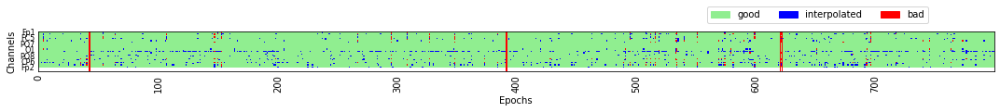

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[10_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: 0.12899855778502164
[10_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.7114777334926466
[10_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -2.680519003609141
[10_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -3.6699099748048973
[10_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.17817718330569615
[10_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.9276070671363679
[10_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -2.7987991928888962
[10_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.2682199997172929
Perf: good, Mean: 

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.60 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 34 epochs: 30, 53, 88, 104, 145, 153, 159, 165, 195, 209, 238, 244, 292, 297, 301, 303, 331, 346, 351, 370, 380, 453, 496, 522, 532, 574, 679, 716, 718, 723, 728, 738, 798, 799


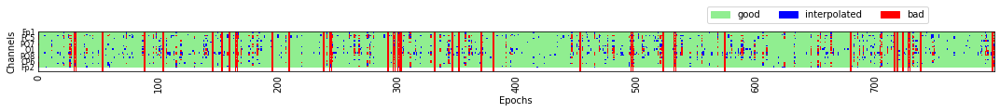

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[11_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -1.115093063879436
[11_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -2.07997262350619
[11_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 0.2526981768420956
[11_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.291531858833455
[11_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -1.269091789420049
[11_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.0937832207151021
[11_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 0.1002212656653608
[11_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.001144490712768785
Perf: good, Mean: -0.5

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 161 epochs: 4, 7, 8, 11, 21, 29, 36, 40, 42, 44, 48, 51, 58, 64, 71, 74, 75, 79, 81, 88, 90, 95, 96, 97, 101, 108, 111, 115, 118, 119, 120, 121, 122, 125, 126, 129, 131, 133, 134, 136, 137, 142, 146, 155, 158, 159, 163, 165, 166, 167, 169, 170, 174, 175, 177, 179, 180, 187, 193, 196, 197, 198, 199, 210, 219, 226, 227, 230, 234, 238, 243, 246, 260, 261, 265, 268, 270, 277, 281, 282, 290, 291, 292, 293, 294, 300, 304, 309, 317, 320, 326, 330, 331, 338, 339, 340, 343, 344, 345, 348, 349, 355, 358, 362, 363, 369, 370, 373, 376, 379, 380, 383, 384, 385, 386, 391, 392, 399, 425, 434, 449, 454, 456, 457, 459, 464, 473, 489, 497, 502, 527, 532, 546, 558, 571, 572, 580, 590, 591, 593, 597, 598, 630, 650, 656, 659, 678, 680, 681, 697, 701, 702, 710, 726, 731, 739, 740, 744, 773, 775, 776


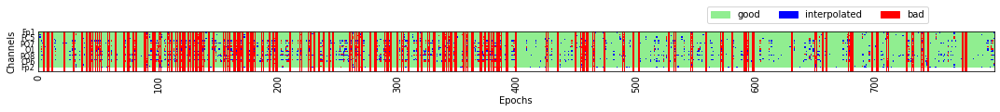

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[12_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -1.4721580259121596
[12_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -2.578142962115775
[12_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.19386529634935137
[12_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.007554599366385655
[12_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -1.329383248517273
[12_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.361600086768789
[12_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.6352996586807528
[12_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.4014526762061905
Perf: good, Mean:

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 30 epochs: 3, 4, 5, 9, 119, 132, 134, 138, 139, 170, 176, 200, 207, 209, 212, 349, 351, 360, 387, 390, 405, 413, 431, 467, 607, 633, 707, 739, 790, 791


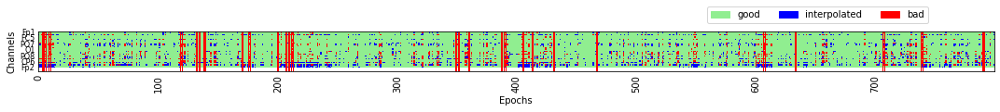

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[13_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.9647992113509954
[13_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.626676682307767
[13_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 0.5725507707065054
[13_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.9204305456216317
[13_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -1.0174535468056967
[13_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.9114996605587687
[13_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 0.2484191441596904
[13_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.9414543630910281
Perf: good, Mean: -0.2

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.70 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 6 epochs: 191, 210, 362, 507, 508, 671


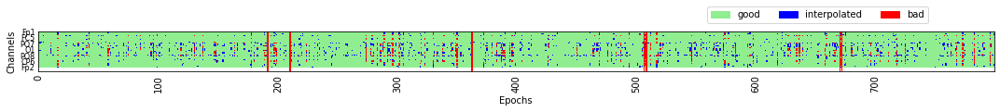

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[15_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: 0.08111861191548216
[15_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 1.3024212051571298
[15_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -1.1532272402286006
[15_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.5271938980208842
[15_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 0.3636278072364557
[15_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.19666927727105366
[15_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.271684410100081
[15_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.0066668001140913
Perf: good, Mean: 

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 46 epochs: 5, 21, 37, 66, 72, 78, 105, 185, 191, 211, 255, 287, 293, 380, 381, 386, 389, 395, 414, 421, 465, 473, 488, 514, 517, 527, 530, 535, 548, 550, 594, 595, 598, 630, 643, 677, 690, 702, 730, 736, 745, 751, 754, 770, 787, 796


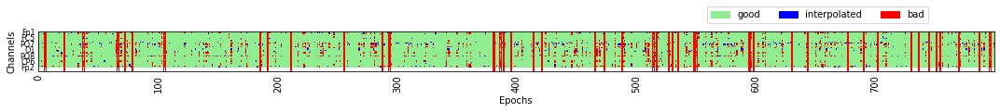

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[16_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: 0.7989951115344995
[16_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.426147078262441
[16_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.7741365376047038
[16_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.1385455329075962
[16_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 0.8446702598678871
[16_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.5907766483288219
[16_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -1.2303291311288362
[16_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.6925271478922564
Perf: good, Mean: -0.

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 42 epochs: 15, 27, 30, 54, 63, 82, 85, 87, 98, 108, 123, 162, 277, 294, 296, 313, 354, 361, 369, 376, 398, 449, 481, 492, 514, 521, 547, 578, 604, 623, 646, 650, 653, 668, 703, 711, 733, 753, 756, 773, 776, 777


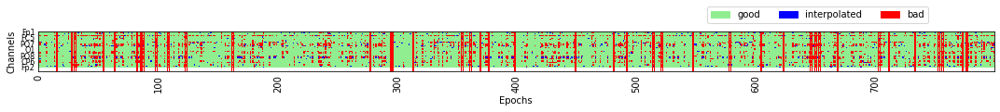

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[17_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.38030019016920685
[17_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.4222679964183729
[17_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.10191811486243849
[17_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.6330600058503245
[17_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.22279477618715568
[17_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.03848522631779295
[17_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 0.1158871015576046
[17_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.0942913590645304
Perf: good, Mean

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.70 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 8 epochs: 148, 349, 487, 561, 610, 636, 706, 766


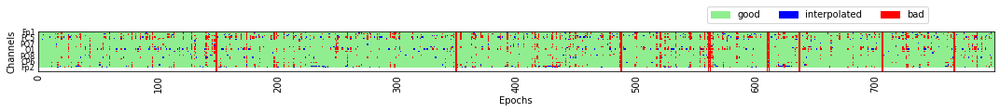

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[18_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -1.2251995892992937
[18_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.7626181314935782
[18_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 1.4432015627154406
[18_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.6097718283036224
[18_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -1.9327731378626436
[18_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.1800412781070293
[18_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 1.2283282377193239
[18_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.9316816299860801
Perf: good, Mean: -

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 46 epochs: 17, 29, 39, 64, 69, 121, 127, 147, 153, 173, 184, 185, 194, 204, 208, 213, 235, 260, 261, 272, 319, 321, 332, 343, 375, 384, 426, 442, 463, 476, 516, 546, 564, 615, 635, 638, 639, 660, 666, 678, 690, 694, 739, 779, 783, 789


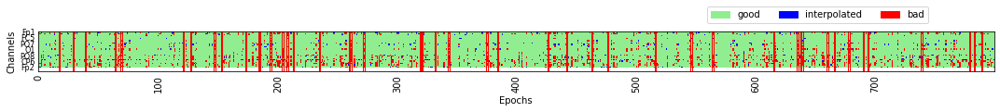

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[20_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.098294497725804
[20_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.46959829957986254
[20_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -1.9147574404046663
[20_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.4908371781058357
[20_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 0.37474659593685006
[20_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.40468851753751806
[20_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.7542204619690912
[20_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.607712536304968
Perf: good, Mean

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 51 epochs: 64, 76, 79, 98, 124, 127, 146, 147, 163, 164, 180, 183, 186, 199, 202, 260, 328, 332, 337, 341, 349, 350, 362, 365, 380, 381, 385, 387, 392, 398, 399, 442, 494, 499, 518, 538, 548, 565, 572, 593, 675, 688, 710, 711, 714, 721, 726, 732, 734, 759, 761


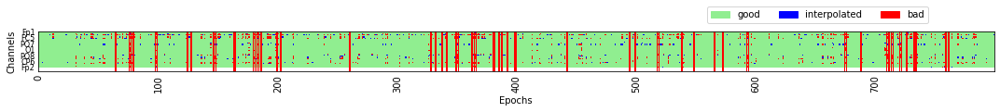

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[21_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -1.6140974556174128
[21_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.933086594908074
[21_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 0.5439755917022703
[21_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.009863942243576484
[21_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.8029874157984089
[21_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.869800404718179
[21_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.1821612766989564
[21_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.14406769530738514
Perf: good, Mean:

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.20 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 172 epochs: 2, 5, 6, 21, 26, 32, 33, 34, 36, 38, 39, 42, 47, 55, 65, 74, 88, 98, 99, 103, 110, 114, 117, 118, 121, 123, 124, 125, 126, 127, 136, 141, 145, 146, 148, 157, 158, 159, 160, 162, 163, 168, 170, 173, 176, 192, 193, 201, 204, 206, 218, 226, 234, 236, 237, 238, 240, 243, 264, 286, 291, 292, 300, 307, 309, 317, 329, 330, 331, 332, 347, 351, 367, 370, 376, 381, 382, 399, 411, 425, 427, 428, 429, 430, 431, 432, 433, 437, 440, 443, 456, 462, 465, 472, 475, 480, 490, 499, 503, 504, 507, 508, 518, 519, 523, 532, 535, 536, 540, 542, 550, 553, 556, 561, 563, 578, 579, 584, 585, 593, 595, 596, 598, 599, 601, 602, 606, 611, 613, 619, 620, 621, 624, 626, 639, 647, 652, 654, 655, 665, 669, 671, 687, 691, 696, 698, 701, 702, 703, 705, 717, 719, 723, 727, 731, 732, 733, 740, 750, 753, 755, 761, 767, 770, 771, 785, 786, 787, 788, 789, 796, 798


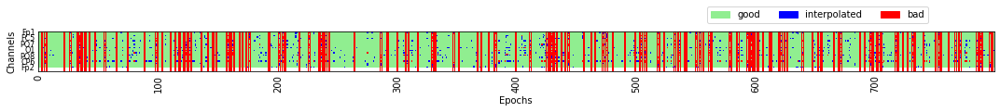

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[22_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.7567991558004875
[22_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.9838042039833774
[22_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.9361401121013718
[22_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.991984795303915
[22_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -1.0074418783173131
[22_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.372554592684515
[22_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -1.4540541353090404
[22_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.1005324535340433
Perf: good, Mean: 

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.60 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.


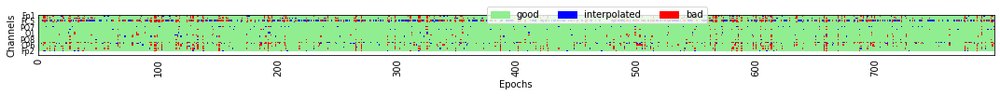

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[23_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: 0.03685542589770245
[23_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.05663063117059273
[23_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.973882811203075
[23_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.959243844642539
[23_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 0.5923266089058921
[23_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 1.1025907428110602
[23_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.1198136484634029
[23_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.7176503377406586
Perf: good, Mean: -0

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 98 epochs: 2, 25, 56, 65, 70, 82, 86, 100, 111, 119, 120, 124, 133, 137, 186, 192, 219, 249, 252, 257, 259, 265, 272, 273, 274, 280, 281, 282, 284, 295, 300, 306, 315, 320, 321, 323, 324, 328, 329, 330, 331, 333, 340, 343, 349, 354, 362, 384, 398, 408, 413, 435, 437, 440, 458, 486, 492, 495, 496, 504, 507, 508, 527, 551, 574, 577, 578, 582, 583, 597, 602, 619, 632, 633, 639, 645, 685, 689, 693, 694, 695, 697, 704, 705, 706, 726, 743, 744, 747, 749, 759, 768, 773, 775, 784, 790, 791, 792


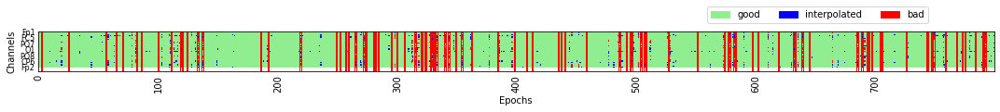

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[24_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: 0.573216066468974
[24_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.4109705598186883
[24_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -1.7894473853749775
[24_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.766386544979913
[24_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 0.18152488977053832
[24_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.9958693436619225
[24_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 0.2890594818961931
[24_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.6421961583521534
Perf: good, Mean: -0.1

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 48 epochs: 0, 7, 21, 33, 50, 96, 99, 143, 157, 166, 207, 228, 232, 233, 271, 292, 295, 350, 371, 402, 415, 424, 425, 427, 428, 454, 459, 471, 479, 496, 524, 525, 545, 556, 578, 580, 589, 597, 621, 635, 704, 750, 754, 765, 770, 771, 792, 798


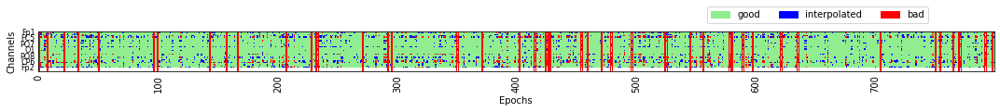

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[25_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -1.364644250626053
[25_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -2.6233414123418113
[25_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.09768609652470231
[25_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.6338795218067201
[25_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -1.827797431206514
[25_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.7666436499435423
[25_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -2.0244911124555416
[25_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.5416027898066775
Perf: good, Mean:

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 79 epochs: 26, 43, 54, 59, 85, 88, 97, 104, 115, 121, 124, 140, 144, 148, 179, 180, 183, 185, 193, 197, 198, 199, 216, 217, 230, 236, 256, 279, 283, 286, 287, 304, 305, 333, 358, 380, 382, 390, 402, 414, 426, 439, 460, 465, 469, 476, 478, 505, 524, 537, 554, 559, 575, 591, 592, 593, 595, 607, 611, 617, 623, 630, 639, 651, 673, 676, 689, 706, 709, 711, 718, 720, 745, 749, 750, 770, 787, 795, 799


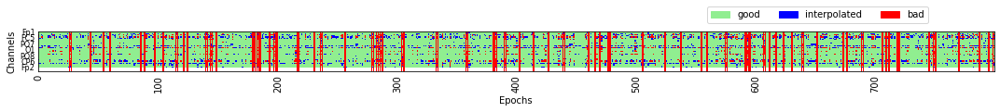

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[28_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.2950614066307643
[28_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.04773002897838663
[28_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.6864420684394178
[28_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.032459005192025235
[28_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.925628540764007
[28_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.3556472666337634
[28_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.5349194266666979
[28_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.1855829608828144
Perf: good, Mean

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 83 epochs: 61, 65, 66, 68, 71, 74, 77, 79, 89, 91, 93, 126, 166, 250, 254, 257, 261, 263, 270, 275, 287, 300, 314, 322, 325, 348, 355, 357, 358, 360, 370, 374, 377, 380, 382, 383, 385, 393, 395, 443, 447, 449, 450, 452, 453, 455, 456, 458, 459, 462, 464, 468, 471, 503, 504, 516, 541, 555, 559, 578, 590, 598, 640, 645, 647, 649, 659, 661, 680, 682, 723, 727, 730, 736, 769, 770, 774, 776, 777, 783, 793, 795, 799


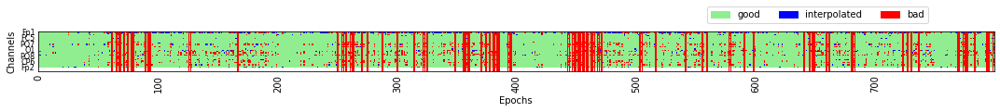

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[29_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.5956575927720694
[29_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.36994210671719446
[29_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.7173704170431138
[29_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.6986874134941575
[29_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.568793738802647
[29_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.3790118453625902
[29_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.6264062588825038
[29_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.16501762580554716
Perf: good, Mean

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.70 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 77 epochs: 2, 3, 4, 5, 6, 7, 8, 10, 11, 66, 67, 79, 84, 88, 118, 126, 141, 160, 187, 197, 199, 201, 202, 203, 207, 208, 209, 210, 211, 212, 218, 281, 282, 283, 301, 318, 325, 346, 347, 356, 380, 396, 400, 401, 404, 407, 409, 410, 416, 450, 451, 459, 475, 480, 498, 526, 527, 528, 556, 563, 573, 599, 600, 603, 604, 605, 609, 614, 615, 662, 665, 673, 699, 719, 764, 777, 778


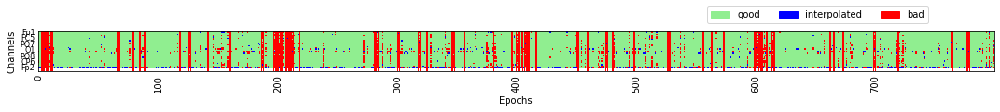

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[31_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.7348559953894842
[31_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.7620507043529727
[31_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -1.9431552837523918
[31_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.28238163379720965
[31_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.3302372978777085
[31_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.4455657899962524
[31_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.4592317134178165
[31_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.987594138895271
Perf: good, Mean:

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 77 epochs: 1, 6, 29, 48, 57, 58, 59, 66, 71, 80, 90, 101, 113, 118, 120, 122, 126, 137, 150, 151, 172, 192, 195, 203, 207, 213, 218, 228, 253, 292, 298, 324, 329, 341, 344, 361, 369, 385, 393, 403, 407, 408, 444, 445, 469, 505, 507, 534, 557, 585, 587, 601, 607, 608, 623, 625, 632, 636, 648, 649, 659, 672, 685, 687, 692, 694, 703, 724, 726, 733, 734, 745, 747, 750, 759, 785, 793


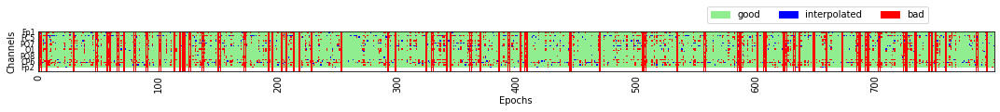

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[34_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: 0.2652118958180891
[34_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.3375839945656136
[34_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -1.7306191162160873
[34_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.2806185303050597
[34_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.7371295761484945
[34_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.1103475452340137
[34_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -1.0942969281660353
[34_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.8082784727097152
Perf: good, Mean:

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.10 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 268 epochs: 10, 13, 15, 18, 19, 20, 21, 24, 29, 30, 31, 34, 35, 36, 37, 38, 39, 40, 41, 43, 44, 46, 47, 48, 49, 51, 52, 53, 54, 56, 57, 59, 63, 65, 66, 68, 69, 70, 71, 72, 73, 74, 75, 81, 83, 84, 85, 86, 87, 89, 90, 91, 92, 93, 94, 96, 97, 98, 100, 101, 102, 103, 107, 108, 114, 115, 117, 122, 130, 171, 189, 204, 205, 206, 207, 208, 210, 214, 215, 216, 217, 218, 221, 222, 224, 225, 234, 235, 236, 238, 239, 240, 241, 243, 247, 248, 261, 265, 266, 267, 270, 271, 272, 273, 274, 275, 279, 285, 286, 287, 288, 290, 291, 293, 301, 302, 303, 304, 305, 308, 310, 319, 323, 325, 326, 350, 355, 362, 364, 377, 383, 407, 409, 410, 412, 413, 414, 416, 417, 421, 425, 426, 427, 428, 430, 431, 433, 434, 435, 436, 437, 439, 440, 442, 443, 445, 446, 447, 448, 449, 450, 455, 459, 460, 461, 462, 464, 466, 474, 476, 477, 478, 479, 486, 489, 491, 492, 503, 508, 532, 551, 571, 573, 574, 575, 576, 581, 582, 583, 587, 611, 613, 614, 615, 616, 620, 622, 624, 625, 626, 627, 628, 629, 630, 632, 633, 634, 635

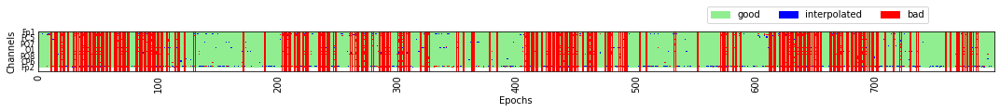

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[35_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.8239788891716017
[35_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -4.760227807915731
[35_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 1.566992634188127
[35_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 2.2312901176666733
[35_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -2.0748476471684456
[35_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -2.1311218252926425
[35_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 1.5430805274353858
[35_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 2.000468173732937
Perf: good, Mean: 0.052

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------


/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items acti

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 87 epochs: 0, 37, 53, 63, 73, 83, 85, 94, 96, 111, 117, 122, 124, 126, 128, 134, 168, 187, 194, 202, 206, 218, 231, 244, 247, 248, 255, 265, 275, 297, 305, 307, 310, 318, 324, 343, 359, 362, 364, 369, 376, 377, 382, 385, 391, 397, 426, 427, 432, 441, 443, 446, 452, 456, 473, 479, 492, 512, 517, 529, 548, 550, 553, 554, 574, 625, 627, 632, 643, 655, 657, 658, 666, 671, 676, 682, 688, 695, 707, 713, 739, 756, 758, 765, 783, 796, 797


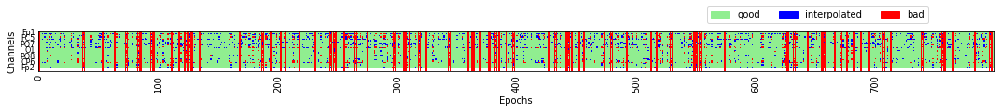

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[36_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: 0.44811081343688286
[36_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.7381834410654451
[36_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.40858286636667174
[36_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.6603070110851151
[36_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.244399138147904
[36_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.22879799820996244
[36_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.42396757230422355
[36_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.0579387956173767
Perf: good, Mea

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.60 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 1 epoch: 557


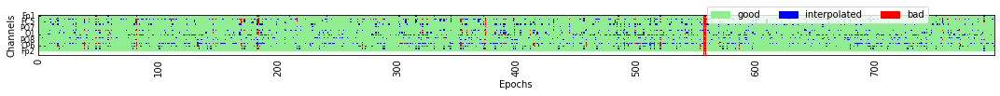

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[38_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -1.2327190425722
[38_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.7665487329756348
[38_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 0.3199236357153423
[38_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 1.834060852021821
[38_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -2.092692984961971
[38_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.26334633153766024
[38_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 0.16535130144114646
[38_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.4081504461418044
Perf: good, Mean: -0.71

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.10 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 213 epochs: 10, 18, 20, 21, 34, 39, 41, 49, 66, 69, 83, 84, 87, 89, 94, 97, 107, 112, 113, 114, 115, 118, 121, 123, 124, 126, 128, 131, 132, 133, 138, 143, 145, 147, 152, 155, 156, 161, 163, 165, 166, 167, 182, 191, 195, 196, 198, 200, 203, 208, 215, 245, 247, 254, 256, 263, 265, 266, 268, 278, 280, 282, 284, 286, 291, 300, 304, 308, 309, 310, 311, 312, 314, 318, 320, 321, 322, 325, 328, 332, 337, 339, 340, 341, 347, 348, 351, 355, 356, 357, 358, 360, 364, 365, 366, 371, 372, 383, 384, 389, 390, 391, 395, 397, 400, 411, 416, 428, 441, 442, 445, 449, 451, 454, 458, 460, 462, 463, 464, 466, 470, 472, 478, 480, 483, 484, 486, 487, 490, 493, 497, 500, 509, 514, 515, 516, 519, 523, 528, 529, 530, 532, 533, 536, 547, 549, 558, 565, 567, 570, 572, 576, 577, 580, 581, 585, 586, 590, 592, 594, 605, 640, 641, 642, 644, 646, 647, 651, 658, 668, 669, 671, 677, 678, 680, 681, 682, 685, 689, 690, 693, 697, 699, 700, 704, 712, 714, 719, 724, 728, 730, 731, 732, 733, 734, 739, 740, 768, 769, 7

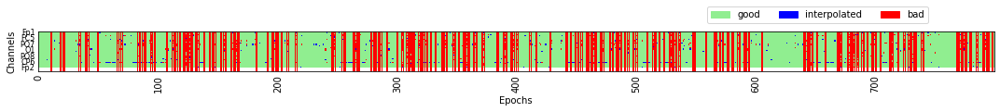

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[39_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: 1.0926375122728011
[39_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.5474606314277951
[39_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -2.587321446759167
[39_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -3.4520183069261643
[39_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 1.9721097919438193
[39_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 1.5589861007907095
[39_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -3.8657951250746283
[39_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -2.3839582696328057
Perf: good, Mean: -0.

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 10 epochs: 190, 231, 315, 564, 570, 603, 685, 687, 715, 786


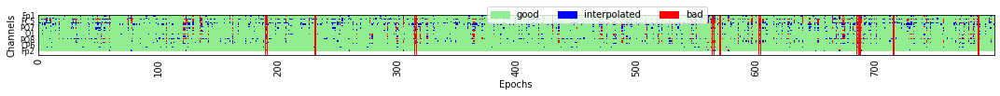

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.9574675558631935
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.4644581999321054
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 0.30720711232824177
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.060133952175171285
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.45685335995661047
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.8035767109232463
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 0.18062218809090885
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 1.189623994849737
Perf: good, Mean: -0.231

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 145 epochs: 7, 23, 29, 39, 40, 55, 56, 65, 66, 76, 80, 87, 88, 90, 107, 115, 119, 124, 126, 127, 128, 130, 132, 134, 139, 150, 151, 160, 166, 170, 172, 182, 187, 209, 211, 212, 218, 219, 236, 241, 243, 262, 279, 284, 285, 294, 308, 309, 313, 316, 327, 329, 336, 352, 354, 355, 357, 359, 361, 362, 371, 373, 374, 375, 377, 378, 379, 386, 389, 406, 409, 411, 418, 419, 420, 426, 443, 447, 451, 461, 469, 470, 479, 481, 487, 488, 500, 508, 520, 521, 522, 524, 526, 538, 540, 543, 545, 549, 564, 565, 573, 576, 584, 594, 599, 611, 612, 623, 632, 636, 638, 640, 643, 649, 662, 673, 674, 678, 684, 688, 690, 693, 695, 698, 710, 712, 721, 722, 725, 729, 736, 738, 746, 754, 755, 756, 771, 775, 778, 779, 780, 790, 792, 797, 799


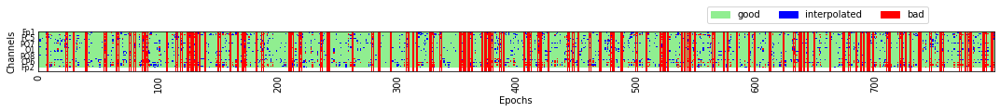

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[42_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.9027662249404583
[42_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.1742152185569874
[42_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.8443250354079557
[42_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.8418434012624648
[42_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -1.4869169948403205
[42_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.424749289522536
[42_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.7693530530303467
[42_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.7498490342301958
Perf: good, Mean:

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment


/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
8

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.60 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 11 epochs: 35, 59, 122, 171, 256, 333, 362, 400, 459, 545, 631


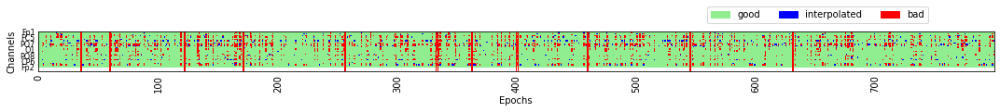

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[5_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -1.7112996139608079
[5_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -2.2474904315060393
[5_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 0.3289266920271125
[5_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 3.335991971448916
[5_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -3.144545921060279
[5_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -3.1437346462533498
[5_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 1.016447998261597
[5_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 3.24103811663886
Perf: good, Mean: -0.877617711183

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.80 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 14 epochs: 10, 81, 96, 138, 164, 171, 214, 371, 431, 440, 702, 720, 742, 751


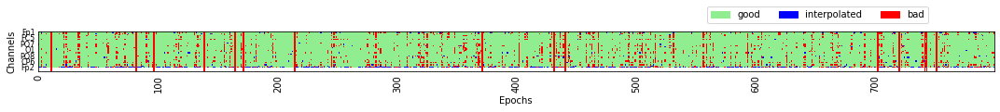

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[6_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.19157934016900607
[6_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.7691988686076663
[6_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -1.2405159678265183
[6_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.47352911895608707
[6_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 0.22782731072826615
[6_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.14602158540237836
[6_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -1.846487969944251
[6_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.059631057395399
Perf: good, Mean: -0.7626

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 157 epochs: 18, 19, 29, 32, 33, 34, 36, 39, 42, 45, 47, 53, 57, 58, 59, 65, 69, 71, 77, 81, 85, 89, 91, 96, 102, 106, 108, 110, 116, 118, 122, 126, 130, 133, 141, 149, 158, 167, 179, 184, 190, 192, 193, 195, 202, 203, 206, 243, 244, 250, 251, 256, 257, 269, 270, 276, 277, 281, 285, 287, 290, 297, 300, 307, 309, 310, 325, 330, 343, 359, 360, 363, 366, 367, 368, 373, 378, 384, 392, 400, 401, 402, 403, 404, 419, 437, 440, 443, 445, 447, 450, 453, 454, 458, 460, 468, 470, 472, 478, 483, 489, 491, 503, 506, 508, 511, 524, 533, 535, 536, 538, 539, 542, 550, 574, 576, 579, 580, 581, 583, 584, 585, 591, 599, 600, 601, 602, 603, 605, 625, 631, 635, 636, 649, 651, 659, 668, 670, 675, 678, 684, 687, 690, 695, 713, 721, 722, 726, 731, 737, 739, 740, 755, 769, 770, 783, 792


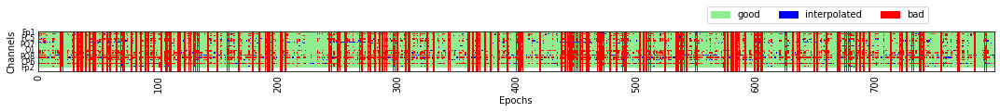

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[7_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -2.402229041146958
[7_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -2.235021014360949
[7_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 0.9112950439785164
[7_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 1.0235923484772798
[7_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -2.546772297919961
[7_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.4932017262064259
[7_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.6900674139035146
[7_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.191759838667753
Perf: good, Mean: -1.181943427

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 44 epochs: 7, 19, 31, 57, 63, 70, 106, 148, 151, 154, 162, 189, 192, 206, 212, 216, 234, 332, 365, 368, 382, 388, 391, 417, 442, 449, 454, 455, 499, 504, 527, 540, 542, 549, 559, 611, 624, 656, 661, 678, 695, 718, 765, 799


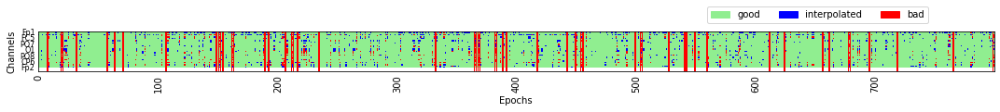

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[9_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.8104449909587502
[9_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.1555273209578536
[9_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 0.6223505801271825
[9_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.715581551097094
[9_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -1.514906506207877
[9_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.471438030480858
[9_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 0.6294298128280097
[9_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.4474562009450173
Perf: good, Mean: -0.268392776

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 115 epochs: 1, 22, 32, 44, 48, 53, 54, 59, 76, 81, 91, 93, 95, 98, 121, 125, 127, 135, 138, 139, 141, 142, 151, 152, 159, 163, 175, 186, 188, 192, 197, 216, 219, 224, 235, 236, 241, 259, 271, 297, 304, 305, 306, 320, 349, 351, 354, 359, 367, 370, 377, 378, 380, 383, 387, 391, 393, 413, 423, 430, 438, 443, 452, 455, 464, 467, 470, 475, 478, 480, 485, 488, 511, 512, 523, 526, 541, 548, 558, 573, 581, 583, 589, 590, 592, 593, 612, 613, 621, 622, 643, 650, 651, 666, 672, 673, 677, 684, 689, 692, 694, 712, 713, 717, 721, 724, 726, 727, 731, 743, 754, 758, 776, 781, 782


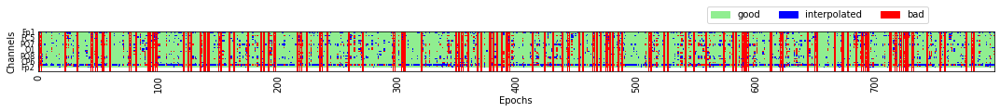

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[11_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.721926859713842
[11_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.2525493123252605
[11_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.3007874369232467
[11_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.26635357500164103
[11_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.31149183283027937
[11_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.3877909972024405
[11_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 0.17922921366757408
[11_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.144294901

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 94 epochs: 2, 23, 31, 37, 45, 48, 58, 70, 80, 82, 83, 96, 97, 101, 107, 119, 120, 131, 133, 134, 141, 153, 169, 188, 189, 193, 205, 218, 228, 239, 243, 246, 264, 268, 269, 275, 278, 279, 293, 304, 305, 306, 312, 313, 327, 339, 345, 352, 371, 387, 389, 391, 396, 398, 402, 406, 429, 453, 456, 459, 494, 509, 517, 527, 533, 534, 539, 543, 548, 559, 576, 585, 589, 599, 601, 604, 609, 613, 616, 642, 654, 664, 669, 677, 692, 717, 719, 753, 762, 766, 775, 787, 790, 799


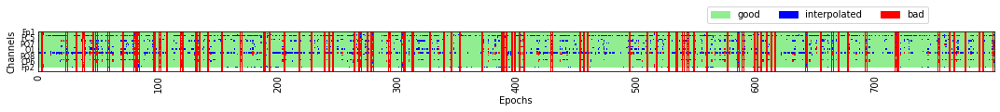

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[14_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.7509830692414134
[14_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -2.0276915838565595
[14_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.009093934548317388
[14_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 1.1719660006088206
[14_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.7565156347870143
[14_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.8391891676907185
[14_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.08633978312664943
[14_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.80960308

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 99 epochs: 26, 38, 51, 52, 67, 71, 87, 100, 108, 115, 122, 124, 134, 139, 146, 151, 152, 155, 163, 174, 177, 181, 185, 189, 195, 198, 219, 223, 237, 241, 242, 265, 283, 284, 290, 296, 297, 320, 325, 327, 337, 340, 350, 355, 366, 369, 370, 374, 381, 388, 391, 393, 409, 425, 440, 441, 446, 462, 475, 487, 490, 492, 495, 507, 525, 538, 551, 552, 554, 571, 577, 582, 590, 596, 598, 611, 641, 659, 660, 676, 681, 693, 699, 709, 717, 721, 726, 730, 745, 747, 760, 761, 774, 779, 782, 788, 789, 795, 799


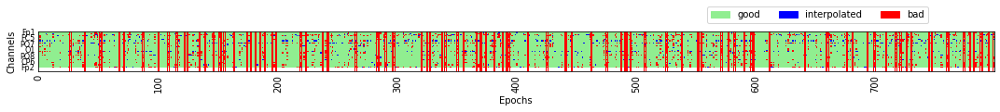

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[16_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -1.1382765715403127
[16_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.5263340426997325
[16_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.39303586947244884
[16_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.1261461545277358
[16_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -1.394184728494278
[16_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.6599612333564896
[16_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.470723541947879
[16_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.50234340927

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.20 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 115 epochs: 10, 16, 18, 33, 40, 43, 50, 52, 56, 65, 87, 88, 93, 98, 106, 109, 113, 115, 120, 122, 125, 129, 140, 142, 145, 148, 175, 176, 179, 184, 188, 190, 191, 192, 218, 227, 231, 251, 258, 262, 266, 267, 282, 283, 284, 289, 296, 298, 312, 316, 325, 335, 340, 343, 347, 348, 349, 353, 361, 384, 386, 393, 404, 455, 457, 463, 468, 489, 491, 492, 497, 500, 503, 505, 509, 526, 532, 534, 537, 550, 556, 557, 558, 564, 568, 573, 575, 584, 589, 594, 595, 597, 599, 603, 605, 609, 633, 637, 646, 659, 664, 666, 690, 692, 697, 698, 703, 712, 721, 726, 727, 773, 778, 783, 796


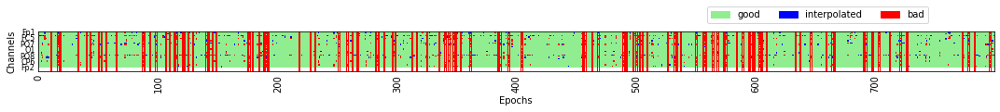

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[17_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: 0.46364441574288257
[17_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.3104263129318945
[17_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -1.6767783852541853
[17_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.3382769014408775
[17_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 0.5790324162426044
[17_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.2704914377889986
[17_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -1.961816940212001
[17_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.004970748101

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 50 epochs: 8, 12, 18, 62, 77, 89, 153, 166, 168, 174, 178, 224, 237, 244, 252, 276, 299, 303, 319, 378, 387, 405, 418, 423, 436, 476, 504, 528, 532, 534, 543, 552, 557, 583, 599, 601, 635, 638, 640, 653, 655, 676, 699, 709, 730, 732, 742, 759, 768, 780


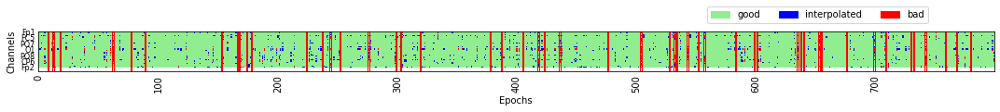

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[18_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: 0.49303403762008696
[18_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.8138602169057797
[18_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -1.4237273045601662
[18_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.9370129704479263
[18_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 0.0936736653177763
[18_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.2007095279526718
[18_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -1.1212466811172666
[18_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.236518240332

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.60 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 7 epochs: 95, 170, 171, 220, 225, 404, 720


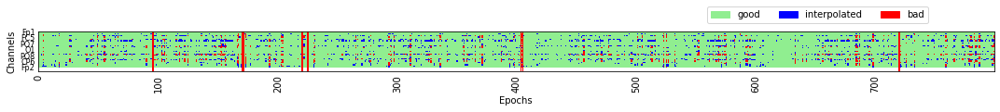

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[19_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -1.3084822417689168
[19_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.1499472873946153
[19_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.5380240923048599
[19_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.27994634505814614
[19_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.18251854937254852
[19_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.2187575717480359
[19_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 0.14740444273870185
[19_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.13217215

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
773 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 773 events and 926 original time points ...
0 bad epochs dropped
A total of 773 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/773 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/773 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/773 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/773 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.10 and n_interpolate=1


  0%|          | Repairing epochs : 0/773 [00:00<?,       ?it/s]

Dropped 191 epochs: 4, 9, 10, 11, 14, 15, 16, 18, 19, 20, 22, 23, 24, 29, 33, 34, 35, 39, 46, 48, 49, 50, 51, 55, 56, 58, 59, 62, 63, 71, 85, 96, 112, 122, 123, 124, 135, 140, 141, 153, 154, 156, 158, 159, 160, 167, 169, 170, 176, 177, 178, 182, 186, 189, 195, 196, 203, 204, 208, 209, 210, 213, 217, 218, 220, 221, 243, 244, 262, 263, 270, 282, 284, 285, 286, 287, 294, 308, 314, 317, 318, 327, 328, 334, 347, 350, 351, 355, 360, 363, 364, 377, 379, 380, 383, 396, 397, 399, 400, 404, 407, 415, 417, 419, 438, 460, 462, 463, 485, 489, 501, 503, 505, 507, 514, 516, 524, 525, 528, 530, 531, 532, 533, 534, 539, 541, 553, 564, 570, 574, 576, 577, 579, 581, 582, 583, 585, 586, 587, 588, 589, 593, 594, 595, 605, 607, 617, 618, 619, 620, 622, 634, 649, 662, 663, 677, 678, 679, 681, 684, 688, 690, 691, 692, 693, 698, 702, 705, 706, 713, 714, 715, 717, 718, 719, 721, 724, 728, 730, 731, 733, 734, 737, 743, 749, 753, 758, 765, 766, 771, 772


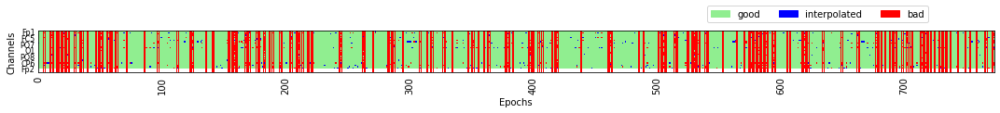

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[21_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: 1.1411015597729315
[21_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -3.081609804431343
[21_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -5.039499027617178
[21_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -2.179705855863368
[21_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 0.07576734409606273
[21_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.844665347453152
[21_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -6.44065513106475
[21_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -6.614797468672751
P

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.10 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 139 epochs: 26, 28, 47, 53, 54, 60, 61, 62, 63, 64, 69, 72, 94, 101, 105, 108, 112, 119, 120, 121, 127, 135, 136, 137, 138, 143, 148, 165, 169, 176, 177, 179, 186, 191, 198, 199, 209, 210, 217, 222, 230, 290, 291, 294, 301, 304, 306, 309, 313, 314, 315, 322, 330, 331, 336, 342, 346, 350, 351, 354, 355, 360, 368, 379, 380, 388, 391, 392, 396, 398, 399, 400, 406, 407, 412, 422, 428, 442, 444, 455, 459, 471, 478, 482, 484, 491, 494, 495, 498, 502, 510, 515, 523, 524, 530, 531, 534, 541, 547, 550, 563, 565, 566, 570, 571, 577, 578, 579, 580, 581, 592, 597, 616, 629, 641, 652, 658, 673, 678, 682, 684, 688, 702, 704, 705, 706, 713, 716, 722, 723, 729, 733, 746, 755, 765, 787, 792, 795, 798


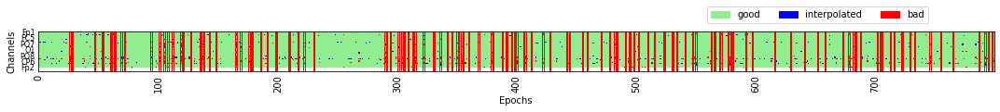

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[22_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: 0.25062975939092136
[22_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: nan
[22_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.4110074498787598
[22_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 2.812984560484713
[22_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 0.2536498304300604
[22_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.15699790310535292
[22_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -1.3172716548359578
[22_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.0355559659667692
Perf: good

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:84: RuntimeWarning: evoked object is empty (based on less than 1 epoch)
  evoked_right = epochs_right.average()
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:85: RuntimeWarning: evoked object is empty (based on less than 1 epoch)
  evoked_left = epochs_left.average()
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_mean

Processing: 23_WM_att_V2_NHKA.vhdr...
Extracting parameters from /Volumes/Nick - Data/CDA Datasets/Hakim 2019/Exp1b/EEGData/23/23_WM_att_V2_NHKA.vhdr...
Setting channel info structure...
Reading 0 ... 4230999  =      0.000 ...  8461.998 secs...


/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=1.00 and n_interpolate=30


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.


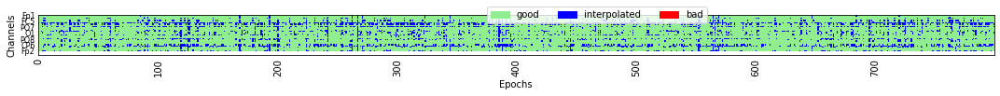

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[23_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.20231773302876332
[23_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.5387408372557713
[23_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.7922202158524835
[23_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.6655228773066688
[23_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 0.11760279299739121
[23_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.4437599853304171
[23_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -1.0653437464919029
[23_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.306527606

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 84 epochs: 19, 33, 42, 46, 53, 62, 85, 86, 93, 96, 106, 119, 139, 142, 187, 189, 204, 205, 226, 248, 267, 284, 292, 299, 310, 313, 317, 318, 319, 324, 325, 326, 337, 338, 343, 346, 349, 360, 361, 368, 369, 375, 399, 412, 426, 439, 452, 477, 478, 484, 490, 496, 504, 508, 514, 517, 556, 576, 578, 587, 588, 591, 592, 617, 625, 658, 667, 682, 690, 691, 692, 698, 702, 705, 706, 716, 720, 730, 734, 765, 770, 771, 787, 792


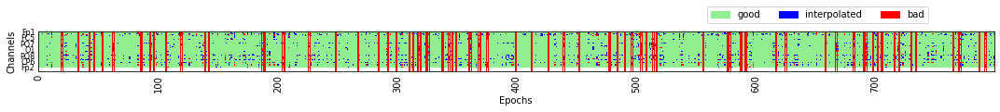

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[24_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.3767606795909594
[24_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.8385763191979415
[24_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 0.2675601554065682
[24_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.6549878569161116
[24_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.049307890435280353
[24_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.5101364532787989
[24_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 0.41037595067523147
[24_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.70906005017

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.20 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 168 epochs: 5, 6, 7, 14, 16, 23, 30, 35, 36, 41, 50, 56, 60, 69, 79, 81, 94, 95, 98, 103, 110, 116, 118, 119, 129, 136, 138, 139, 140, 141, 142, 145, 146, 151, 157, 167, 173, 178, 190, 193, 196, 204, 205, 207, 213, 215, 218, 219, 224, 225, 227, 229, 233, 235, 237, 239, 251, 254, 255, 266, 267, 272, 285, 289, 291, 293, 295, 297, 303, 306, 307, 309, 312, 314, 315, 321, 322, 334, 336, 339, 341, 345, 346, 364, 375, 379, 381, 388, 389, 393, 407, 411, 413, 414, 415, 416, 419, 436, 439, 444, 447, 458, 461, 462, 473, 476, 479, 498, 500, 504, 511, 513, 514, 518, 526, 527, 529, 530, 534, 535, 538, 545, 555, 558, 563, 566, 568, 569, 571, 574, 582, 584, 585, 586, 589, 591, 596, 597, 606, 608, 613, 631, 634, 666, 671, 678, 680, 682, 695, 701, 702, 711, 715, 716, 731, 733, 748, 749, 751, 763, 766, 778, 780, 784, 785, 794, 796, 797


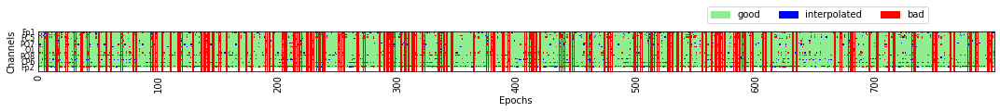

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[28_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: 0.002893031352254839
[28_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.417658262673592
[28_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.2515591046487154
[28_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.014464475628937544
[28_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -1.5839949024814863
[28_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -2.0799607330222085
[28_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.8042249096854952
[28_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.3384340

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 32 epochs: 72, 134, 143, 156, 170, 181, 197, 266, 298, 313, 340, 343, 457, 558, 571, 580, 581, 585, 596, 598, 624, 625, 641, 680, 706, 722, 750, 751, 755, 787, 788, 792


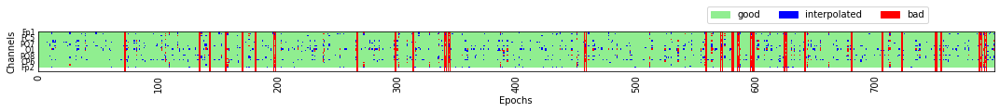

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[29_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: 1.074088786922769
[29_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 1.2611674861440838
[29_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.8528149524084517
[29_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.5202846854145607
[29_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 1.0585564360633615
[29_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 1.330830164414042
[29_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.9449371510185626
[29_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.843515174446600

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 26 epochs: 3, 9, 16, 44, 46, 61, 66, 75, 96, 124, 127, 175, 271, 288, 291, 341, 366, 434, 564, 568, 577, 582, 672, 679, 680, 698


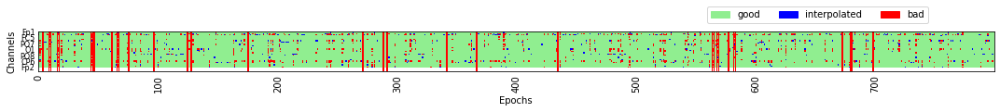

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[3_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -1.4075329705551525
[3_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -3.926978909045968
[3_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 0.8386710458379034
[3_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.012779618755803466
[3_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -1.8360477876158856
[3_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -2.6143595626395677
[3_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 0.7042661346177221
[3_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.9301355153642666
Perf: good, Mean: -0.42516

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.20 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 137 epochs: 0, 17, 18, 23, 25, 28, 34, 38, 48, 64, 88, 89, 109, 111, 113, 119, 121, 123, 124, 130, 132, 133, 146, 147, 154, 163, 166, 168, 169, 177, 180, 182, 192, 194, 195, 198, 205, 208, 209, 211, 220, 222, 228, 229, 243, 252, 254, 257, 266, 271, 274, 279, 301, 304, 312, 325, 329, 339, 341, 343, 344, 352, 363, 366, 371, 382, 383, 390, 391, 398, 413, 420, 421, 422, 435, 437, 457, 471, 480, 485, 499, 500, 501, 502, 505, 506, 509, 511, 514, 520, 521, 525, 535, 538, 542, 581, 582, 583, 584, 586, 594, 595, 614, 620, 624, 626, 634, 635, 636, 642, 651, 665, 687, 690, 697, 699, 702, 706, 708, 709, 710, 723, 726, 731, 735, 737, 744, 747, 748, 751, 752, 755, 776, 778, 780, 796, 799


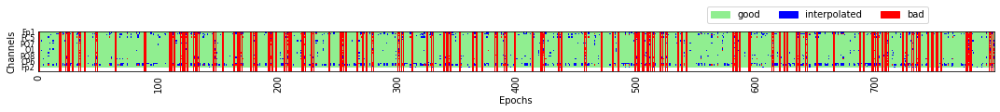

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[30_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.7596257510725588
[30_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.37528024607700367
[30_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 0.013533425195475129
[30_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 2.0119043383634736
[30_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.9190708326002397
[30_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.3424729154236839
[30_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.3326705640725199
[30_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.382663559

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.10 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 144 epochs: 8, 18, 19, 38, 39, 41, 51, 61, 62, 66, 70, 79, 80, 82, 85, 89, 100, 106, 107, 109, 114, 115, 116, 117, 120, 133, 145, 157, 159, 166, 179, 190, 195, 198, 208, 212, 215, 220, 224, 236, 238, 247, 248, 250, 254, 258, 261, 265, 270, 271, 272, 274, 289, 290, 291, 292, 293, 307, 312, 313, 316, 319, 322, 327, 333, 361, 369, 370, 373, 385, 389, 391, 419, 425, 430, 431, 434, 451, 469, 480, 484, 490, 492, 493, 505, 511, 513, 514, 534, 535, 536, 546, 552, 564, 569, 574, 577, 578, 579, 593, 616, 617, 621, 622, 628, 639, 643, 645, 650, 652, 653, 660, 661, 667, 673, 674, 679, 680, 685, 688, 692, 694, 718, 719, 720, 733, 735, 738, 748, 757, 760, 761, 762, 766, 767, 769, 772, 773, 775, 777, 783, 789, 791, 797


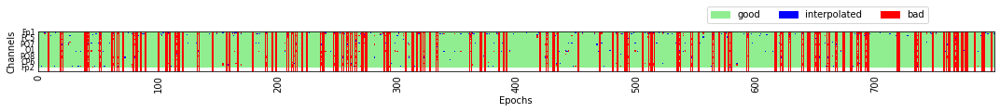

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.2431619835661669
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.25342833987781105
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.26486683520300436
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.509224023896365
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 0.5674234249257559
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.18488696064509158
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.9020565355972905
[4_WM_att_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.189182809871208
Perf: good, Mean: -0.21066

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak', 'StimTrakAudio']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting 

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 4 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak', 'StimTrakAudio']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.60 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 45 epochs: 23, 69, 70, 94, 95, 97, 98, 126, 137, 148, 149, 150, 157, 233, 244, 247, 262, 303, 306, 312, 313, 329, 351, 353, 409, 468, 483, 495, 511, 517, 551, 595, 614, 639, 657, 662, 665, 707, 710, 716, 764, 768, 778, 785, 799


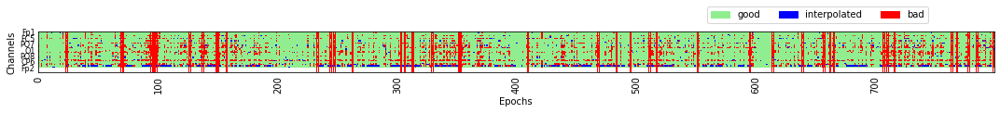

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[5_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.7097211603021106
[5_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.749438575660181
[5_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.10162004868299467
[5_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.22391532488067734
[5_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -1.077327966883656
[5_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.5431675377204903
[5_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.5435029954313508
[5_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.32353037186603156


/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 97 epochs: 7, 8, 15, 22, 25, 28, 31, 39, 58, 62, 69, 70, 73, 90, 93, 94, 110, 135, 148, 153, 155, 156, 160, 169, 179, 184, 191, 229, 234, 254, 257, 266, 269, 279, 296, 300, 332, 337, 339, 365, 386, 394, 405, 430, 433, 442, 443, 446, 448, 454, 456, 461, 489, 499, 502, 506, 529, 532, 535, 555, 558, 566, 572, 584, 588, 610, 623, 626, 627, 644, 645, 646, 657, 670, 677, 685, 693, 694, 695, 696, 699, 701, 730, 734, 736, 738, 740, 744, 747, 748, 749, 761, 765, 778, 780, 781, 790


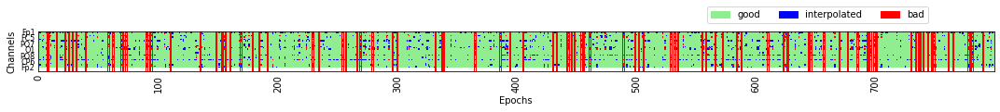

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[6_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.14910867119276333
[6_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.3181212293163623
[6_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 0.5499838056602494
[6_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 2.0006733592764947
[6_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.4971559597605998
[6_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.568336042054784
[6_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: 0.30144017513904825
[6_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.097870885188708
Perf:

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=1.00 and n_interpolate=30


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.


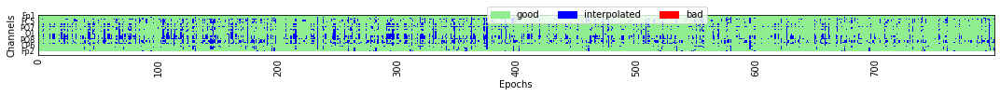

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[7_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.22748663194233112
[7_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.5660560352051841
[7_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.5326225149561424
[7_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.7156375820231253
[7_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: 0.022048721102816384
[7_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.2916634416621204
[7_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -1.1618062277753507
[7_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.0436793461554414


/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 49 epochs: 20, 43, 79, 82, 88, 125, 171, 182, 229, 238, 240, 263, 275, 315, 361, 373, 383, 391, 398, 417, 480, 482, 486, 500, 518, 537, 591, 594, 598, 599, 614, 619, 628, 642, 651, 667, 676, 681, 687, 693, 718, 724, 735, 739, 740, 752, 755, 790, 796


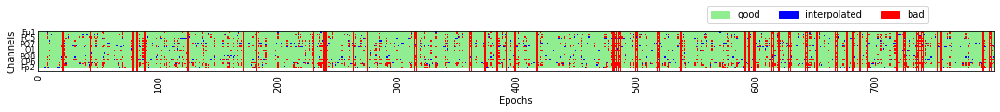

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[8_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.3609998959445673
[8_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.07611503343547428
[8_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: -0.9505445745855141
[8_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-bad: 1.6406532418844113
[8_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.3190685918091708
[8_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.024582543573599104
[8_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -0.7794302669205604
[8_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.901639389851190

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 10 epochs: 85, 98, 125, 134, 152, 282, 357, 411, 478, 572


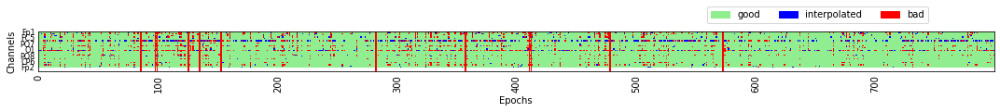

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[9_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-good: -0.7458036576191911
[9_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-left-bad: -4.94109022355316
[9_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 2-right-good: 0.12331941005319136
[9_WM_att_V2_NHKA.vhdr] Skipping: 2-right-bad
[9_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-good: -0.9220662687506163
[9_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.8236690966012638
[9_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-good: -1.3806770660645875
[9_WM_att_V2_NHKA.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.825684166502974
Perf: good, Mean: -0.7313068955953008


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))


Processing: 1_KiNi3.vhdr...
Extracting parameters from /Volumes/Nick - Data/CDA Datasets/Hakim 2019/Exp2a/EEGData/1/1_KiNi3.vhdr...
Setting channel info structure...
Reading 0 ... 4206829  =      0.000 ...  8413.658 secs...


/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyquist limit) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.70 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 24 epochs: 42, 68, 194, 215, 269, 303, 307, 345, 356, 368, 376, 377, 393, 425, 440, 472, 494, 505, 543, 728, 750, 778, 784, 787


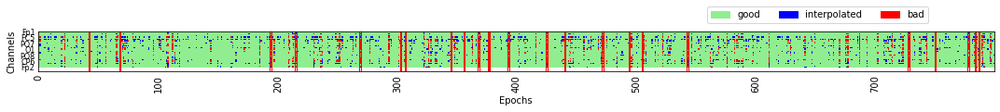

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[1_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -0.9632274662676881
[1_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.5571339903473237
[1_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: 0.29290919534152954
[1_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.06937045512101332
[1_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: -1.889299508880935
[1_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.5449903290378395
[1_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: 0.6925818248502489
[1_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.42573941574654944
Perf: good, Mean: -0.46675898873921123
[-0.9632274662676881, -1.8892995088

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 69 epochs: 0, 4, 29, 38, 53, 77, 87, 90, 91, 92, 101, 103, 109, 111, 114, 126, 142, 145, 157, 188, 194, 195, 210, 217, 237, 277, 278, 283, 287, 294, 298, 304, 311, 317, 337, 339, 347, 364, 368, 372, 378, 398, 408, 436, 451, 478, 486, 498, 513, 541, 546, 573, 576, 595, 597, 599, 630, 639, 683, 684, 685, 690, 698, 732, 748, 757, 767, 779, 798


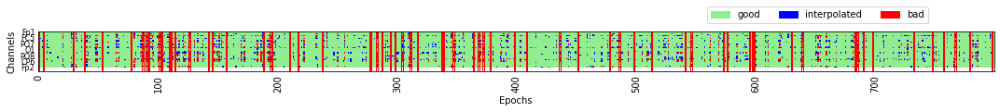

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[10_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -0.5251759557960184
[10_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.5668828331687026
[10_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: -1.3865434760601345
[10_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.9079650476220895
[10_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: -1.0197459198988037
[10_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.3552999977551875
[10_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: -1.6487132928940205
[10_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -2.4344490976921773
Perf: good, Mean: -1.1450446611622442
[-0.5251759557960184, -1.01

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyquist limit) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.60 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 10 epochs: 158, 337, 363, 534, 540, 545, 548, 581, 734, 749


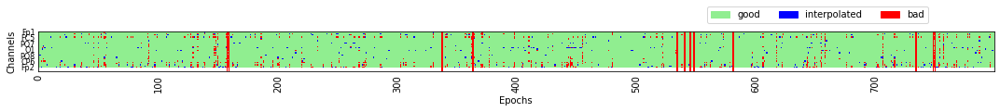

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[11_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -1.1272097825559677
[11_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.5659425740339307
[11_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: 0.1364542873092472
[11_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.5238254927428441
[11_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: -1.1014260521682946
[11_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.4984988787909983
[11_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: 0.16360621304426096
[11_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.04694732720793117
Perf: good, Mean: -0.48214383359268853
[-1.1272097825559677, -1.1

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment


/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
8

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 37 epochs: 1, 22, 46, 71, 77, 116, 163, 191, 195, 204, 206, 268, 315, 333, 362, 379, 399, 415, 466, 520, 523, 532, 593, 615, 651, 654, 659, 705, 708, 718, 719, 721, 753, 762, 765, 766, 792


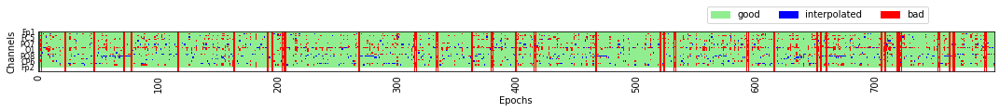

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[12_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -0.13372305125375106
[12_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.01518139148732466
[12_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: 1.2898352600643546
[12_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.04567056115868916
[12_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: -0.7627227098314714
[12_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.28229860389292205
[12_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: 1.2181661429585597
[12_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: 1.6612232602392305
Perf: good, Mean: 0.402888910484423
[-0.13372305125375106, -0.7

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 27 epochs: 38, 71, 93, 99, 100, 104, 135, 185, 235, 265, 290, 308, 312, 330, 345, 359, 421, 446, 462, 497, 507, 553, 611, 649, 684, 686, 688


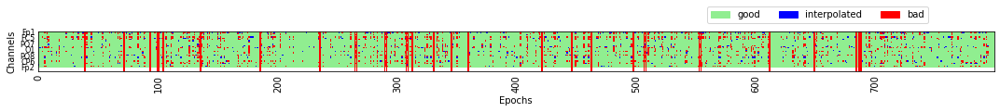

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[13_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: 0.11424985964406584
[13_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.03449608039513641
[13_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: -0.42030196631280753
[13_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.22618019913602427
[13_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: 0.09167668535203435
[13_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.6947059021563762
[13_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: -0.29064299437996216
[13_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.329669764922109
Perf: good, Mean: -0.12625460392416737
[0.11424985964406584, 0.0

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 88 epochs: 16, 18, 24, 46, 50, 53, 56, 76, 83, 88, 97, 98, 110, 112, 117, 143, 144, 154, 158, 167, 170, 183, 194, 195, 210, 255, 258, 263, 268, 269, 273, 276, 277, 279, 293, 313, 321, 323, 325, 337, 338, 343, 370, 374, 375, 378, 379, 395, 396, 425, 429, 436, 507, 514, 529, 535, 537, 557, 568, 570, 574, 585, 588, 596, 599, 624, 634, 640, 642, 647, 654, 656, 668, 669, 674, 680, 683, 707, 713, 727, 735, 746, 762, 766, 767, 770, 774, 783


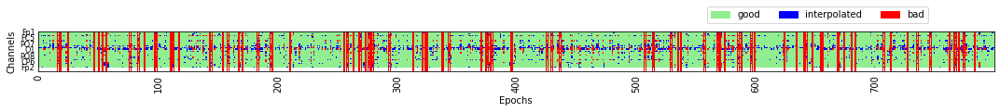

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[15_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: 0.012209171644398829
[15_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.8648318997432705
[15_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: -1.590504187817802
[15_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.6112756710838465
[15_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: 0.3442013366933527
[15_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.31873901576190733
[15_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: -2.6041460898228905
[15_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.587070462808635
Perf: good, Mean: -0.9595599423257353
[0.012209171644398829, 0.3442

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 120 epochs: 33, 46, 47, 52, 60, 66, 68, 69, 78, 81, 90, 94, 104, 106, 108, 111, 115, 119, 123, 124, 126, 131, 138, 139, 142, 143, 146, 147, 149, 171, 175, 178, 197, 230, 231, 236, 243, 256, 259, 268, 272, 273, 278, 283, 285, 289, 291, 297, 300, 313, 314, 318, 327, 350, 359, 360, 362, 367, 369, 388, 391, 392, 393, 396, 408, 409, 436, 447, 451, 455, 456, 467, 468, 469, 479, 488, 491, 492, 504, 516, 537, 564, 572, 579, 581, 585, 586, 593, 619, 620, 630, 636, 643, 648, 655, 666, 668, 670, 691, 693, 697, 717, 718, 720, 722, 731, 733, 735, 737, 757, 760, 767, 774, 775, 777, 781, 782, 783, 794, 799


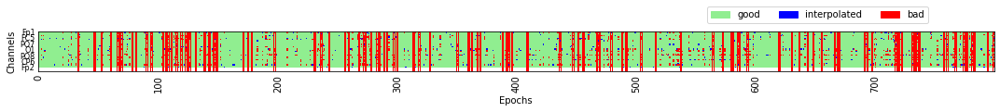

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[16_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -0.7148057779834955
[16_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.538091899707656
[16_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: -1.070746086041616
[16_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.28419978385629846
[16_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: -1.4806631258175071
[16_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.6907691549059
[16_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: -0.5034946782258208
[16_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.7801071820370976
Perf: good, Mean: -0.94242741701711
[-0.7148057779834955, -1.4806631

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=1.00 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 8 epochs: 52, 281, 296, 297, 338, 356, 385, 413


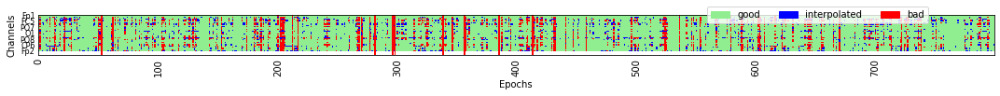

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[17_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -0.32529685853201956
[17_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.46958618548481773
[17_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: -0.4334331117731784
[17_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.46047826520720914
[17_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: 0.5787217881024451
[17_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.14617409732244804
[17_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: 0.5982623547806907
[17_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.10554135081551191
Perf: good, Mean: 0.10456354314448446
[-0.32529685853201956, 0

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 19 epochs: 17, 40, 93, 160, 220, 259, 312, 383, 421, 438, 443, 452, 523, 580, 629, 670, 710, 763, 768


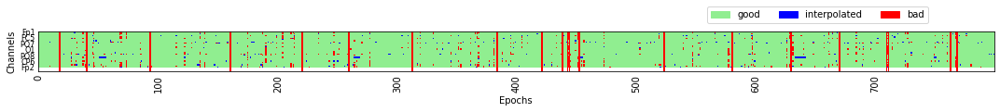

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[18_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -0.14287335360156747
[18_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.6154827767123013
[18_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: -0.13427893859979537
[18_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.4233994086201857
[18_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: -0.6779521537205339
[18_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.5173933442763811
[18_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: -0.22631673990740103
[18_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.21684198500711527
Perf: good, Mean: -0.29535529645732445
[-0.14287335360156747,

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 12 epochs: 3, 15, 33, 131, 148, 436, 496, 504, 586, 671, 738, 775


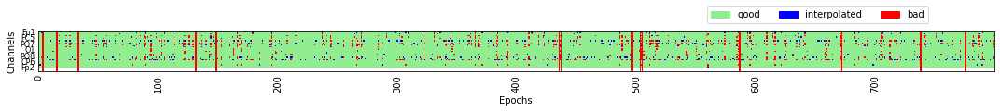

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[19_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -1.567578946872875
[19_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.8227110101078727
[19_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: -1.5237940071913936
[19_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.5615713239468285
[19_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: -2.4053029955057563
[19_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: -2.507708794238778
[19_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: -1.9106258588138325
[19_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.8918550812216064
Perf: good, Mean: -1.8518254520959645
[-1.567578946872875, -2.4053

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyquist limit) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of E

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.60 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 3 epochs: 390, 448, 671


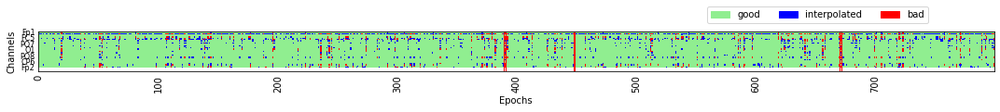

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[2_2_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -2.9226037155989135
[2_2_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -2.4575288701805285
[2_2_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: 1.6509641842533813
[2_2_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: 2.2152403835956096
[2_2_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: -3.582569725849294
[2_2_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: -3.460231788034937
[2_2_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: 1.494595758819529
[2_2_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: 1.0010459784434842
Perf: good, Mean: -0.839903374593824
[-2.9226037155989135, -3.5

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.60 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 27 epochs: 33, 42, 127, 193, 199, 220, 247, 274, 346, 353, 354, 446, 480, 482, 501, 515, 545, 561, 563, 569, 586, 656, 665, 667, 673, 675, 783


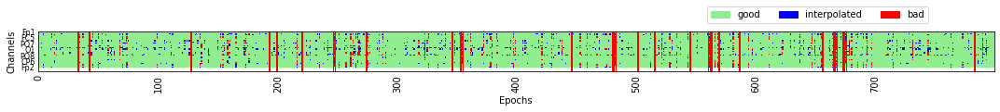

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[20_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: 0.6094919715296974
[20_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.23693470565207764
[20_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: -0.2974379835809332
[20_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.2372619709787682
[20_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: -0.13754752008090868
[20_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.032323849054909704
[20_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: -0.20676569414389182
[20_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.20239772898341557
Perf: good, Mean: -0.008064806569009077
[0.6094919715296974, 

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.80 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 5 epochs: 196, 263, 456, 696, 711


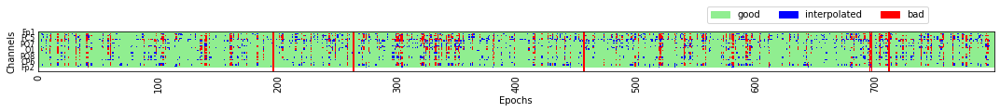

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[22_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -0.6544304572871684
[22_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.6090382590540938
[22_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: -0.6422333779668116
[22_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.3253392103293845
[22_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: -0.9999887248762921
[22_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.5319943745195181
[22_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: -1.4282675717182256
[22_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.5987173848585792
Perf: good, Mean: -0.9312300329621245
[-0.6544304572871684, -0.99

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 41 epochs: 6, 67, 87, 99, 102, 111, 128, 146, 149, 195, 215, 229, 247, 255, 279, 288, 290, 303, 357, 374, 389, 395, 434, 493, 494, 499, 508, 522, 525, 530, 536, 577, 585, 596, 631, 664, 670, 683, 720, 737, 761


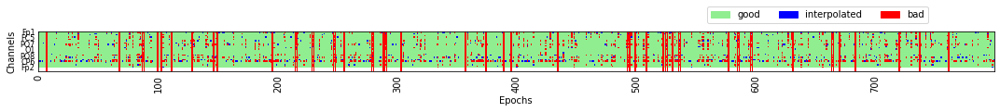

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[3_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -0.1303480427111879
[3_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.1640226461020489
[3_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: -0.38056688665966415
[3_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.38343603139684274
[3_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: 0.2914926911692047
[3_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.6858065353992499
[3_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: -1.0455002707900436
[3_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.5638817065403028
Perf: good, Mean: -0.3162306272479227
[-0.1303480427111879, 0.291492691

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 73 epochs: 8, 10, 23, 28, 32, 54, 58, 62, 77, 79, 85, 88, 90, 128, 135, 138, 150, 155, 179, 188, 193, 195, 201, 203, 206, 229, 253, 254, 261, 271, 273, 279, 289, 291, 317, 321, 338, 340, 362, 372, 374, 378, 395, 400, 432, 440, 491, 499, 503, 508, 515, 516, 520, 540, 552, 571, 572, 582, 588, 590, 597, 610, 636, 644, 649, 660, 681, 687, 706, 732, 767, 786, 787


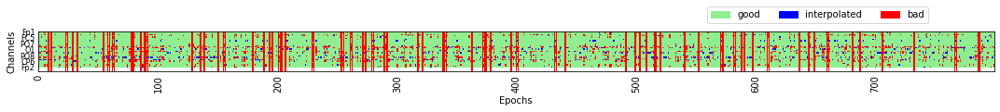

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[4_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: 0.20746430387164988
[4_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.697150367013754
[4_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: -0.9732464977725278
[4_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.3151882148804687
[4_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: 0.14800616008668122
[4_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.5067367959095016
[4_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: -1.3556725216390828
[4_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.5508744914966809
Perf: good, Mean: -0.49336213886331987
[0.20746430387164988, 0.14800616008

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 5 epochs: 320, 388, 465, 515, 536


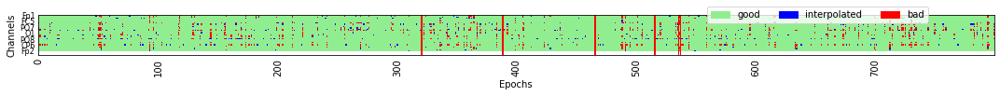

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[5_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: 1.4857927013013177
[5_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.9404369329374783
[5_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: -0.14443281871995842
[5_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.10149362538630667
[5_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: 2.247930774825418
[5_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: 1.3710840390008614
[5_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: -0.34949200233849065
[5_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.8674209992840759
Perf: good, Mean: 0.8099496637670716
[1.4857927013013177, 2.247930774825418

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 37 epochs: 15, 69, 100, 103, 107, 176, 208, 219, 287, 310, 313, 314, 320, 329, 352, 373, 374, 383, 385, 470, 476, 486, 523, 526, 557, 576, 600, 623, 675, 676, 716, 731, 747, 770, 773, 774, 789


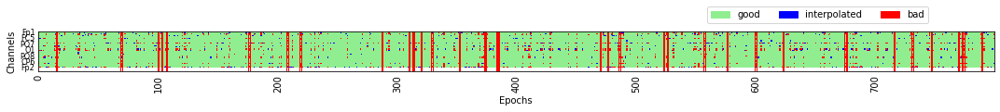

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[6_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -0.9103865775460329
[6_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.6453094649518996
[6_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: 0.22131321836679954
[6_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.22752834075474263
[6_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: -1.0624883437952417
[6_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.5937518972822395
[6_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: 0.1942020806686485
[6_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.11479541157223902
Perf: good, Mean: -0.38933990557645665
[-0.9103865775460329, -1.062488343

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 58 epochs: 24, 27, 28, 43, 50, 72, 84, 114, 118, 138, 150, 178, 227, 228, 242, 257, 300, 301, 335, 336, 337, 338, 344, 352, 360, 386, 396, 413, 426, 429, 430, 473, 477, 490, 491, 498, 502, 505, 515, 526, 527, 537, 554, 576, 578, 581, 607, 620, 626, 634, 651, 665, 678, 728, 736, 754, 770, 794


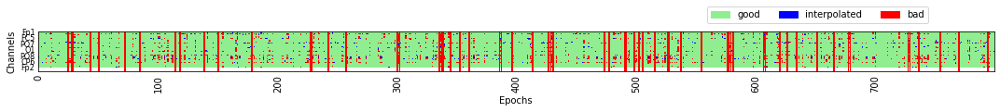

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[7_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -0.6898330212657925
[7_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.6204691944237736
[7_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: 0.8642366007266411
[7_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.748611064924473
[7_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: -0.837772431027398
[7_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.5843392895709945
[7_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: 0.6458357894492918
[7_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.8145898873753172
Perf: good, Mean: -0.004383265529314367
[-0.6898330212657925, -0.8377724310273

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyquist limit) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 41 epochs: 15, 18, 19, 96, 127, 130, 142, 151, 157, 189, 196, 225, 232, 237, 292, 334, 348, 355, 416, 429, 430, 491, 506, 525, 536, 537, 538, 539, 584, 592, 607, 614, 638, 648, 661, 662, 668, 669, 695, 704, 776


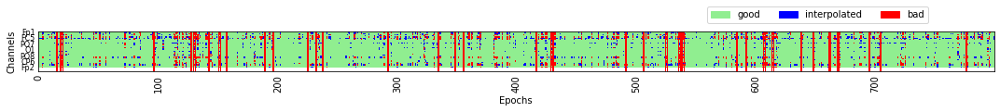

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[8_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -0.8024886501214578
[8_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.5696264977157258
[8_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: -0.8624781353909873
[8_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.9419763931333468
[8_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: -0.7524361958434825
[8_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.6113058570122468
[8_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: -1.163748998903014
[8_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.5943708623551549
Perf: good, Mean: -0.8952879950647354
[-0.8024886501214578, -0.7524361958

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.70 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 26 epochs: 15, 53, 88, 100, 150, 293, 304, 333, 364, 425, 428, 429, 440, 454, 469, 530, 579, 605, 629, 660, 710, 713, 728, 740, 776, 799


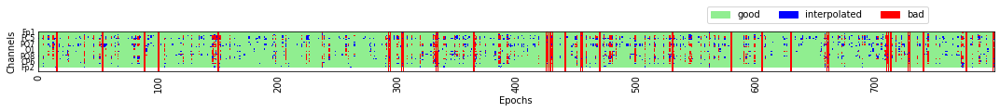

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[9_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-good: -1.0636711464206994
[9_KiNi3.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.812681828322457
[9_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-good: -0.09022768198247302
[9_KiNi3.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.078214473439006
[9_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-good: -1.2123636720530082
[9_KiNi3.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.178263385588163
[9_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-good: -0.1955379947735496
[9_KiNi3.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.5377870770522432
Perf: good, Mean: -0.6404501238074326
[-1.0636711464206994, -1.21236367205

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.20 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 187 epochs: 2, 6, 7, 10, 11, 12, 16, 23, 39, 43, 47, 66, 68, 69, 75, 79, 81, 84, 90, 100, 103, 106, 107, 110, 111, 118, 121, 124, 126, 127, 128, 132, 134, 138, 140, 143, 145, 147, 149, 156, 157, 158, 160, 161, 162, 165, 173, 175, 187, 189, 193, 199, 201, 210, 217, 220, 243, 248, 258, 272, 274, 275, 283, 284, 285, 289, 301, 302, 303, 304, 309, 312, 314, 317, 318, 319, 329, 342, 344, 345, 355, 358, 362, 363, 365, 367, 368, 375, 385, 386, 388, 389, 391, 394, 399, 406, 407, 409, 432, 438, 440, 453, 456, 473, 474, 502, 508, 509, 512, 513, 515, 520, 534, 535, 539, 542, 544, 555, 566, 572, 577, 584, 585, 586, 587, 588, 589, 592, 597, 599, 601, 612, 624, 625, 634, 635, 639, 641, 664, 667, 673, 679, 685, 692, 693, 696, 697, 700, 705, 706, 708, 709, 710, 713, 718, 719, 722, 724, 725, 726, 727, 733, 734, 735, 737, 738, 741, 744, 746, 749, 750, 752, 753, 757, 758, 762, 772, 780, 781, 782, 783, 784, 789, 792, 793, 798, 799


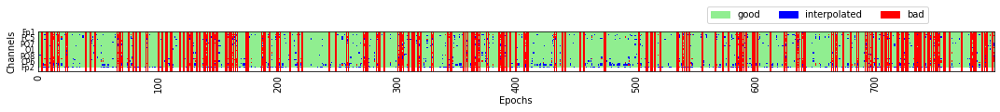

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[1_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -0.9066391987199172
[1_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.3764272251552612
[1_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: 0.06881792329379767
[1_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.1625372685170682
[1_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -1.0458328038515488
[1_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.8451512132976586
[1_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -0.4606085359866766
[1_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.6719144972289122
Perf: good, Mean: -0.5860656538160862
[-0.9066391987199172, -1.045832803

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.70 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 1 epoch: 63


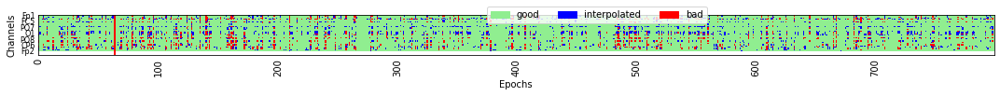

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[10_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -0.6478967192265543
[10_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.371178989316036
[10_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: 0.7202657636259818
[10_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: 1.0945138299375923
[10_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -0.8794985981864829
[10_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.6252185693365887
[10_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: 0.5721814478982578
[10_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.09851678585075739
Perf: good, Mean: -0.058737026472199416
[-0.6478967192265543, -0.879

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 55 epochs: 25, 28, 29, 37, 56, 59, 93, 111, 116, 122, 130, 167, 180, 225, 245, 250, 253, 273, 276, 279, 284, 289, 322, 344, 362, 373, 387, 400, 424, 444, 456, 474, 491, 501, 523, 532, 538, 556, 562, 569, 588, 628, 637, 646, 652, 658, 659, 661, 680, 681, 743, 754, 762, 766, 788


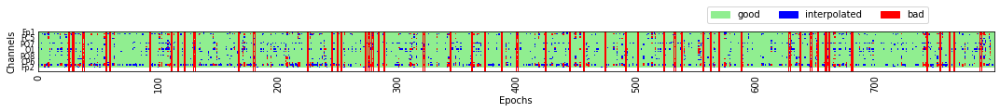

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[11_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -1.0717335347293586
[11_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.2762840691037068
[11_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -0.3242097909621316
[11_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.3291760482085029
[11_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -2.228242634475043
[11_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.0387867126733117
[11_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -0.4385957091714737
[11_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.9728328074725052
Perf: good, Mean: -1.0156954173345016
[-1.0717335347293586, -2.228

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 50 epochs: 2, 3, 14, 16, 25, 36, 42, 87, 127, 142, 231, 234, 239, 241, 244, 254, 277, 278, 281, 282, 290, 292, 323, 341, 345, 370, 397, 405, 410, 419, 515, 524, 525, 528, 544, 548, 553, 569, 586, 609, 649, 655, 660, 673, 682, 687, 689, 703, 715, 738


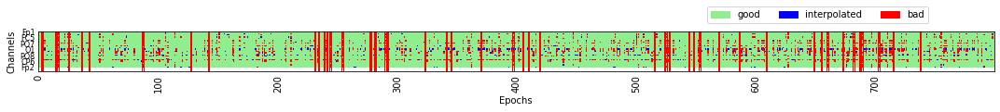

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[12_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -1.1545100058928333
[12_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.7302736144678625
[12_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -0.3486253424842434
[12_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.4691163731286107
[12_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: 0.19903622235252508
[12_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.2720702722923328
[12_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -0.6879160311015027
[12_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.736843089638213
Perf: good, Mean: -0.49800378928151356
[-1.1545100058928333, 0.19903

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=1.00 and n_interpolate=30


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.


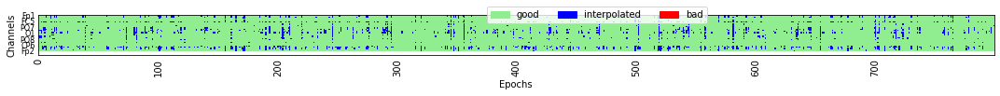

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[13_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -0.8454910498088691
[13_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.9540147945158377
[13_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -0.4179225770586561
[13_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.6070136184096885
[13_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -0.7940108779848822
[13_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.9352793206634112
[13_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: 0.2527236997050067
[13_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.6267769532756118
Perf: good, Mean: -0.4511752012868501
[-0.8454910498088691, -0.79

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 84 epochs: 6, 18, 19, 24, 28, 57, 59, 60, 64, 65, 66, 73, 81, 82, 91, 92, 112, 113, 145, 152, 159, 175, 179, 183, 192, 220, 247, 272, 277, 288, 309, 335, 345, 348, 358, 363, 364, 367, 382, 388, 393, 394, 433, 438, 446, 458, 474, 475, 478, 481, 484, 496, 497, 500, 515, 544, 554, 576, 580, 588, 590, 594, 611, 635, 650, 665, 671, 674, 681, 683, 684, 697, 706, 727, 730, 748, 752, 769, 771, 775, 782, 787, 790, 798


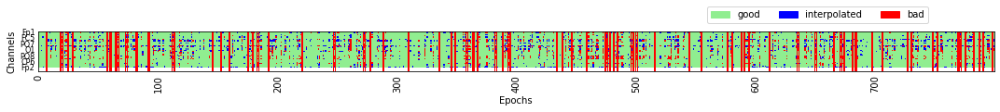

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[14_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -0.674711125826499
[14_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.033295324755007946
[14_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -0.38874959549656307
[14_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.2454290723922552
[14_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: 0.5138774790113504
[14_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.3469599234204785
[14_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: 0.731893394036727
[14_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.7109868236607922
Perf: good, Mean: 0.04557753793125385
[-0.674711125826499, 0.51387

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10


/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 15 epochs: 9, 71, 123, 209, 294, 414, 426, 497, 587, 604, 632, 642, 684, 704, 739


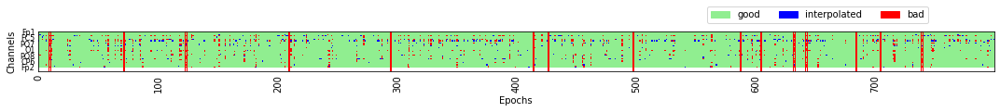

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[15_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: 1.5269224792889275
[15_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.17848564140059486
[15_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -1.2055066128870326
[15_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.6246477806683874
[15_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: 1.157733796204831
[15_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: 1.171323996252059
[15_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -1.4040374178653872
[15_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.5002410146950148
Perf: good, Mean: 0.01877806118533476
[1.5269224792889275, 1.1577337

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 52 epochs: 4, 15, 61, 75, 84, 93, 128, 132, 142, 145, 150, 156, 160, 169, 181, 185, 194, 213, 215, 237, 249, 297, 298, 303, 308, 313, 315, 316, 333, 341, 347, 353, 364, 383, 397, 415, 443, 462, 478, 500, 506, 521, 537, 546, 592, 613, 631, 659, 685, 715, 718, 780


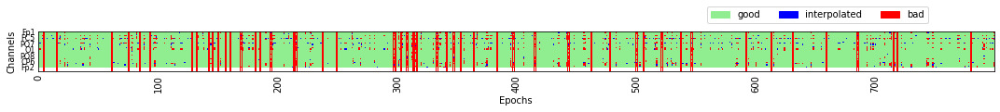

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[16_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -4.437158509726051
[16_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -3.390837128135905
[16_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: 1.4495056524877328
[16_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: 1.8757317148742487
[16_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -4.825376917945181
[16_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -4.098670318856767
[16_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: 3.192477640568822
[16_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: 2.3428264817722173
Perf: good, Mean: -1.1551380336536692
[-4.437158509726051, -4.82537691794

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 42 epochs: 37, 54, 57, 98, 108, 111, 124, 138, 155, 166, 196, 205, 253, 265, 269, 279, 282, 305, 314, 347, 360, 376, 384, 399, 418, 490, 537, 558, 570, 579, 590, 638, 652, 654, 670, 690, 699, 713, 724, 755, 756, 788


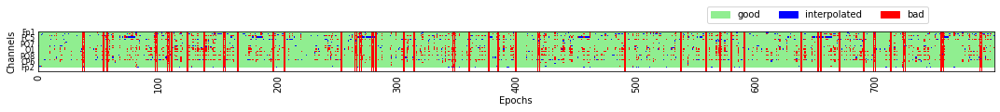

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[18_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -2.0329006906510867
[18_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -2.310183136440505
[18_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: 0.6408283611772281
[18_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.7493563150922165
[18_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -1.9168979106323334
[18_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.9907815392488855
[18_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: 0.11648949694116568
[18_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.49396816356758216
Perf: good, Mean: -0.7981201857912565
[-2.0329006906510867, -1.9168

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
632 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 632 events and 926 original time points ...
0 bad epochs dropped
A total of 632 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/632 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/632 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/632 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/632 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.60 and n_interpolate=4


  0%|          | Repairing epochs : 0/632 [00:00<?,       ?it/s]

Dropped 43 epochs: 7, 58, 60, 103, 108, 117, 118, 153, 155, 156, 204, 210, 214, 231, 247, 249, 250, 274, 276, 283, 304, 345, 373, 383, 386, 391, 411, 428, 454, 456, 459, 466, 491, 497, 503, 520, 531, 547, 556, 570, 572, 606, 620


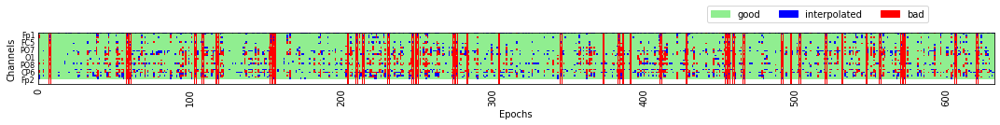

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[19_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -0.46383606485161455
[19_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.18305105768009589
[19_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: 0.04437750027603526
[19_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.44319928199756187
[19_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -0.11251518106297591
[19_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.651287522557213
[19_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: 0.744736640783057
[19_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.863603505215379
Perf: good, Mean: 0.053190723786125466
[-0.46383606485161455, -0.11

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 152 epochs: 1, 3, 4, 5, 9, 11, 12, 18, 21, 24, 34, 37, 43, 45, 46, 48, 51, 53, 59, 63, 65, 67, 74, 75, 85, 93, 103, 105, 126, 137, 138, 145, 146, 149, 153, 155, 162, 172, 181, 182, 183, 191, 195, 205, 206, 207, 208, 209, 210, 211, 221, 224, 227, 234, 240, 241, 249, 250, 254, 257, 281, 296, 301, 303, 304, 313, 352, 353, 359, 372, 374, 376, 377, 381, 384, 387, 389, 392, 402, 404, 406, 415, 420, 421, 433, 438, 451, 454, 458, 459, 474, 478, 495, 497, 501, 502, 503, 523, 526, 532, 537, 541, 542, 544, 554, 563, 569, 578, 585, 587, 593, 595, 596, 599, 601, 602, 604, 619, 631, 632, 638, 642, 646, 648, 661, 672, 675, 677, 689, 690, 704, 706, 717, 718, 722, 724, 738, 739, 750, 753, 754, 760, 761, 762, 767, 768, 769, 775, 788, 790, 794, 797


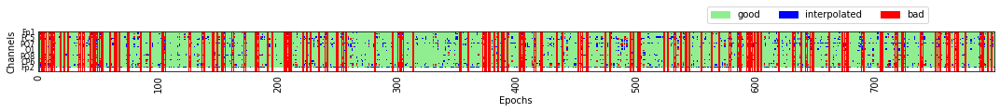

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[20_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -0.9900857863757762
[20_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.40925047844674584
[20_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -1.4997496879880166
[20_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.7899969072482655
[20_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: 0.1649979660199234
[20_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.7796710481257246
[20_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -1.876788087697126
[20_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -2.7584763049588554
Perf: good, Mean: -1.0504063990102488
[-0.9900857863757762, 0.164

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 3 epochs: 379, 549, 675


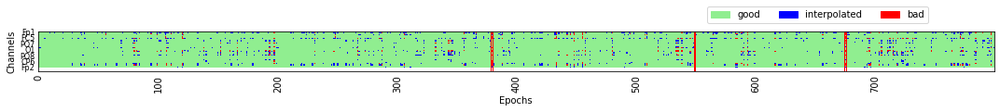

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[21_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -1.2748210743890287
[21_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.5807586017356905
[21_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -0.07615452892325197
[21_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: 1.5930594809448733
[21_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -1.4400947194158709
[21_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.3993199838034405
[21_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -0.16887100687131268
[21_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.0882389787231048
Perf: good, Mean: -0.7399853323998661
[-1.2748210743890287, -1.

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.90 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.


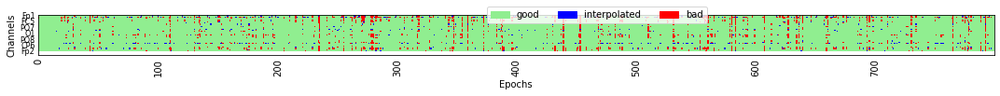

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[22_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -0.8497922701121352
[22_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: 0.5148433453314901
[22_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -0.5263969967316403
[22_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.2128156133371479
[22_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -1.355562710479661
[22_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.6808954776313517
[22_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -1.4900680091370075
[22_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.8150461300887134
Perf: good, Mean: -1.055454996615111
[-0.8497922701121352, -1.3555

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.80 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 4 epochs: 17, 355, 400, 502


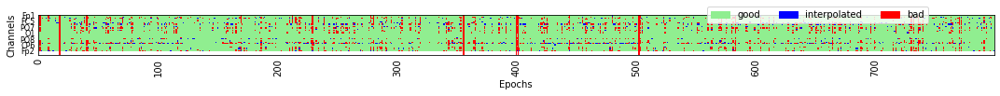

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[23_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -1.160056809816432
[23_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.459447269798628
[23_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: 0.11763464954365059
[23_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.6467902544874764
[23_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -2.113131911631268
[23_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.7426762258673484
[23_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -0.027345577685572702
[23_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.20709562585259295
Perf: good, Mean: -0.7957249123974055
[-1.160056809816432, -2.113

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 28 epochs: 2, 29, 47, 51, 97, 126, 128, 154, 182, 200, 271, 283, 303, 332, 407, 408, 461, 471, 555, 596, 597, 673, 697, 703, 712, 717, 755, 793


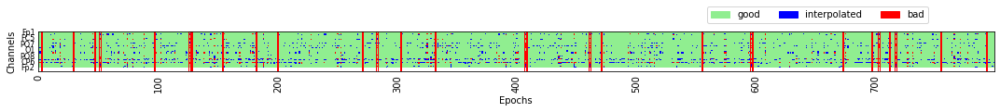

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[24_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -0.8646481793206181
[24_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.9248172806581088
[24_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: 0.0846814965862067
[24_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.7656246417779674
[24_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -0.5907281217419503
[24_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.49121767279929884
[24_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: 0.06274635929322414
[24_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.26110521663089536
Perf: good, Mean: -0.3269871112957844
[-0.8646481793206181, -0.5

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 160 epochs: 4, 10, 14, 21, 22, 24, 30, 48, 51, 56, 62, 66, 73, 89, 96, 106, 119, 123, 137, 141, 146, 149, 151, 154, 155, 156, 157, 163, 166, 167, 169, 180, 196, 197, 198, 200, 201, 208, 209, 212, 213, 214, 216, 217, 223, 230, 232, 235, 243, 246, 251, 253, 259, 261, 266, 294, 300, 315, 319, 320, 321, 326, 334, 343, 354, 355, 358, 359, 364, 368, 374, 375, 378, 379, 401, 404, 406, 408, 424, 430, 432, 433, 441, 446, 451, 453, 456, 459, 463, 471, 472, 473, 474, 476, 479, 495, 502, 518, 519, 523, 525, 526, 527, 529, 540, 541, 551, 567, 569, 570, 576, 596, 600, 605, 610, 611, 612, 613, 614, 623, 637, 640, 643, 655, 660, 661, 665, 666, 668, 677, 686, 688, 689, 700, 701, 708, 710, 714, 717, 725, 726, 727, 731, 735, 736, 737, 742, 750, 757, 763, 767, 770, 772, 773, 776, 778, 783, 784, 793, 794


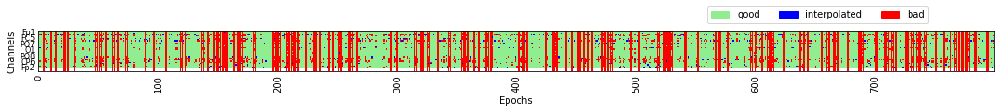

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[25_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -1.1674989175762154
[25_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.7379688847980621
[25_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -0.11175908518241462
[25_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.7179919560928869
[25_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -1.517141740614877
[25_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.071858162731904
[25_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -0.6801100375712851
[25_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.47363074675300304
Perf: good, Mean: -0.8691274452361981
[-1.1674989175762154, -1.5

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 101 epochs: 11, 15, 31, 90, 91, 92, 96, 97, 98, 99, 104, 105, 110, 113, 126, 128, 129, 135, 145, 165, 174, 180, 184, 189, 197, 218, 220, 246, 286, 289, 290, 305, 307, 328, 329, 340, 345, 359, 364, 367, 374, 375, 381, 394, 404, 408, 418, 421, 422, 424, 438, 439, 445, 451, 453, 461, 463, 471, 473, 479, 487, 489, 492, 494, 505, 506, 508, 512, 519, 521, 526, 533, 534, 535, 536, 541, 545, 546, 558, 569, 584, 587, 592, 593, 609, 627, 637, 645, 663, 687, 694, 695, 710, 719, 743, 747, 754, 759, 760, 775, 786


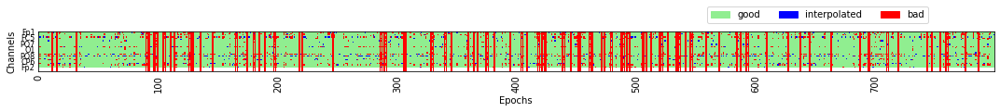

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[26_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -2.5258407710484927
[26_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.27149655175581644
[26_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: 0.3664200272600122
[26_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: 1.1513422852341213
[26_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -2.5728073415405315
[26_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -3.3156828375687493
[26_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -0.03595362261325174
[26_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.5235993676355087
Perf: good, Mean: -1.192045426985566
[-2.5258407710484927, -2.572

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.20 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 144 epochs: 1, 12, 13, 17, 18, 24, 34, 46, 48, 53, 56, 70, 72, 74, 80, 82, 83, 84, 87, 95, 102, 117, 123, 133, 142, 149, 160, 168, 175, 176, 179, 184, 197, 200, 201, 202, 215, 216, 223, 247, 248, 250, 259, 260, 269, 272, 274, 276, 277, 283, 284, 288, 290, 293, 295, 296, 298, 300, 304, 311, 317, 318, 320, 324, 325, 327, 331, 334, 336, 357, 358, 359, 377, 382, 387, 388, 390, 410, 421, 423, 434, 439, 440, 441, 468, 470, 473, 474, 475, 479, 485, 488, 499, 504, 522, 528, 547, 548, 553, 554, 570, 571, 574, 577, 579, 580, 582, 588, 594, 596, 606, 608, 609, 644, 645, 647, 660, 664, 667, 671, 674, 677, 679, 682, 692, 695, 699, 706, 707, 711, 755, 761, 762, 763, 764, 765, 766, 769, 771, 773, 774, 777, 778, 795


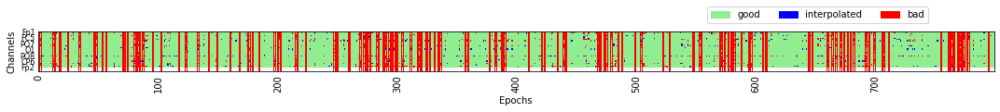

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[27_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: 2.023565061773552
[27_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: 2.0010235674045673
[27_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -1.3789716745491436
[27_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.7058356784982718
[27_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: 2.043637246556788
[27_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: 2.420373715251615
[27_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -2.845769489973165
[27_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -2.0492398094174757
Perf: good, Mean: -0.03938471404799215
[2.023565061773552, 2.04363724655

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 46 epochs: 16, 60, 73, 84, 89, 94, 131, 132, 133, 148, 197, 238, 242, 251, 280, 283, 323, 334, 335, 336, 339, 354, 365, 373, 387, 396, 435, 436, 446, 470, 502, 503, 504, 511, 519, 526, 578, 587, 609, 619, 630, 705, 725, 746, 766, 799


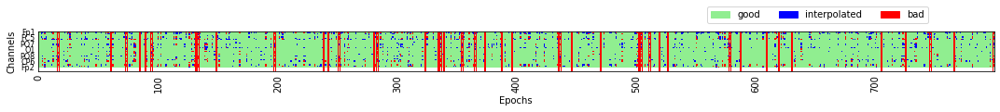

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[28_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -0.18830097171062338
[28_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.6369094064630121
[28_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -0.5178154078009671
[28_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.9343531529662488
[28_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -0.2995717817355556
[28_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.028586351559692396
[28_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -0.8401961960120673
[28_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.01578700598024228
Perf: good, Mean: -0.4614710893148033
[-0.18830097171062338, 

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 38 epochs: 3, 6, 26, 27, 68, 105, 115, 126, 129, 133, 173, 282, 322, 328, 335, 339, 350, 353, 356, 407, 413, 420, 459, 487, 498, 539, 540, 585, 655, 665, 670, 699, 734, 737, 742, 781, 783, 799


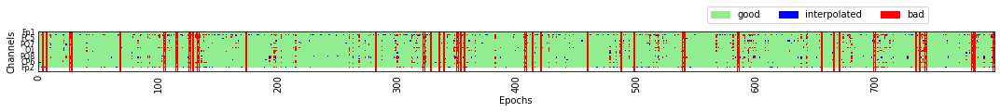

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[29_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -1.1335104272539085
[29_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.8339785131333339
[29_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -0.6487648167049185
[29_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.0551062075164845
[29_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -1.593974518253825
[29_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.481124918624906
[29_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -0.14281709562893202
[29_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.8444538914563363
Perf: good, Mean: -0.8797667144603959
[-1.1335104272539085, -1.59

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 30 epochs: 16, 149, 151, 170, 213, 215, 234, 331, 344, 348, 349, 378, 388, 395, 421, 443, 447, 452, 480, 485, 500, 551, 599, 633, 638, 745, 749, 751, 783, 785


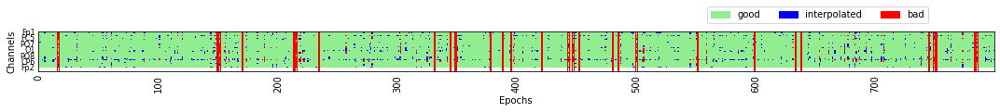

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[3_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -0.5393652341503212
[3_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.4275617903241201
[3_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -1.3537329837443501
[3_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.0502053418634631
[3_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -1.581838045527498
[3_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.5504983621068559
[3_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -1.0212344606122639
[3_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -2.0318672521980856
Perf: good, Mean: -1.1240426810086082
[-0.5393652341503212, -1.5818380455

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 52 epochs: 22, 46, 52, 53, 58, 62, 71, 88, 109, 171, 181, 189, 197, 228, 237, 256, 265, 287, 293, 304, 316, 349, 361, 364, 373, 375, 383, 385, 392, 395, 399, 412, 418, 419, 427, 437, 453, 469, 504, 507, 509, 534, 565, 576, 588, 589, 619, 650, 713, 756, 765, 799


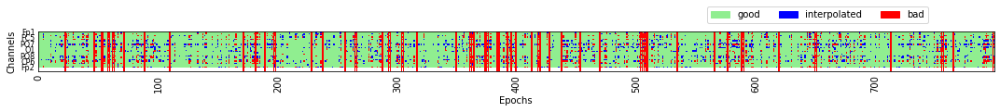

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[37_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -1.1871036272118902
[37_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.07572961151369095
[37_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: 0.5025737424787765
[37_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: 1.3035845678603863
[37_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -1.0533863253011897
[37_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.2755365355875474
[37_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: 1.1179579403225945
[37_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.5659113348676614
Perf: good, Mean: -0.15498956742792724
[-1.1871036272118902, -1.053

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 22 epochs: 12, 70, 85, 110, 114, 186, 188, 190, 253, 331, 442, 477, 479, 489, 517, 544, 571, 589, 670, 714, 783, 785


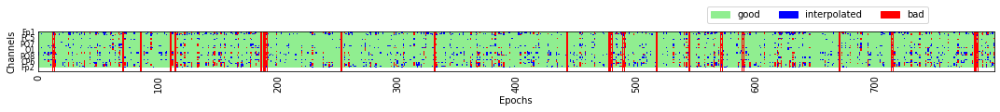

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[4_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -0.03697306095393243
[4_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.5971474975719178
[4_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -0.4764153112591729
[4_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.8389172518779807
[4_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -0.152623382908328
[4_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.9929754195030948
[4_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -1.283927576355141
[4_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.5094687262937256
Perf: good, Mean: -0.48748483286914357
[-0.03697306095393243, -0.152623382

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 53 epochs: 27, 65, 70, 78, 79, 89, 91, 92, 94, 97, 106, 153, 176, 212, 215, 253, 274, 277, 321, 328, 359, 368, 372, 373, 387, 430, 460, 467, 473, 477, 481, 487, 494, 495, 536, 556, 562, 567, 577, 582, 595, 596, 597, 599, 654, 681, 692, 694, 698, 701, 744, 771, 796


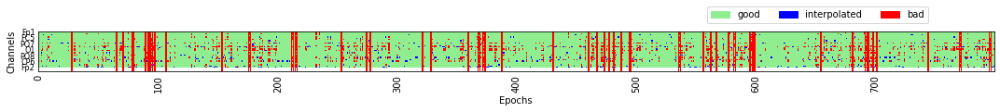

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[45_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: 1.188144029361091
[45_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: 1.0786802938580666
[45_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -1.4301659171392394
[45_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.721950985527257
[45_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: 1.434957293500483
[45_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: 1.5588604735558238
[45_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -1.5435047928764187
[45_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.8999273798681657
Perf: good, Mean: -0.08764234678852101
[1.188144029361091, 1.4349572935

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.80 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.


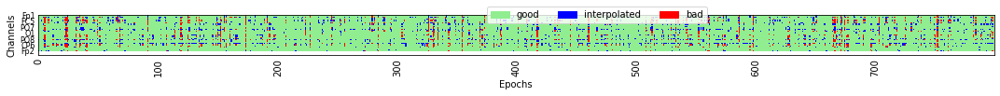

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[5_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -1.7371854347088282
[5_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.7563005988071148
[5_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: 0.7253406821660859
[5_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.8344876479234029
[5_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -1.4917194512077068
[5_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.0945656760132805
[5_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: 0.23722672875927764
[5_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.15501419701527802
Perf: good, Mean: -0.5665843687477928
[-1.7371854347088282, -1.49171945120

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 92 epochs: 7, 42, 68, 70, 71, 84, 101, 108, 111, 112, 115, 117, 120, 130, 138, 154, 166, 177, 179, 191, 192, 199, 216, 253, 276, 291, 293, 298, 307, 308, 310, 315, 320, 334, 336, 352, 353, 357, 369, 377, 386, 392, 416, 418, 434, 453, 459, 467, 487, 490, 499, 514, 527, 529, 544, 548, 569, 574, 584, 585, 587, 591, 613, 620, 621, 649, 658, 661, 662, 663, 681, 690, 696, 707, 708, 709, 712, 713, 715, 717, 725, 727, 733, 737, 742, 744, 772, 773, 787, 788, 793, 797


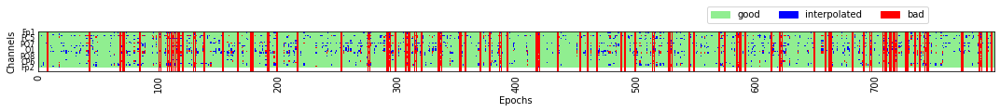

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[50_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -2.61550973203653
[50_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -2.6211646858174356
[50_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: 0.20465267338225648
[50_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.7729819912787883
[50_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -2.793592648518914
[50_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -2.1583818403141715
[50_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -0.9277994221973784
[50_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.8010968853515964
Perf: good, Mean: -1.5330622823426414
[-2.61550973203653, -2.793592

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.10 and n_interpolate=1


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 335 epochs: 1, 3, 9, 11, 14, 20, 23, 26, 28, 29, 34, 37, 38, 39, 42, 43, 44, 46, 47, 49, 52, 58, 61, 64, 65, 66, 67, 70, 71, 73, 76, 80, 85, 87, 88, 90, 95, 97, 98, 101, 102, 104, 105, 110, 113, 116, 117, 119, 122, 123, 124, 125, 128, 131, 132, 133, 134, 135, 136, 139, 140, 141, 144, 145, 146, 147, 151, 152, 154, 157, 159, 160, 164, 168, 171, 174, 176, 183, 184, 186, 187, 190, 193, 194, 196, 197, 198, 199, 206, 208, 213, 216, 218, 224, 230, 232, 236, 237, 240, 244, 248, 249, 250, 251, 255, 256, 257, 263, 267, 268, 271, 274, 278, 281, 282, 284, 290, 293, 294, 295, 296, 299, 301, 315, 316, 317, 319, 322, 326, 327, 329, 330, 331, 333, 334, 335, 338, 339, 340, 342, 343, 344, 345, 347, 349, 350, 358, 359, 360, 361, 363, 370, 372, 373, 379, 380, 381, 383, 384, 386, 387, 388, 389, 390, 393, 394, 395, 396, 397, 399, 403, 406, 413, 416, 418, 421, 423, 424, 425, 426, 428, 429, 433, 437, 444, 451, 453, 459, 460, 461, 462, 464, 469, 470, 471, 473, 474, 476, 478, 482, 484, 486, 488, 492, 49

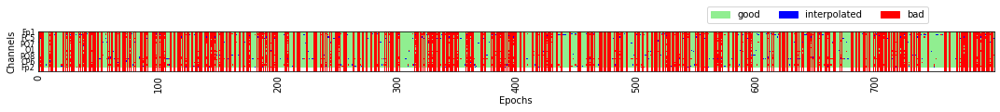

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[6_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -0.41678582214100085
[6_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.08956521947687056
[6_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -0.16112915662538857
[6_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -0.45444238076844723
[6_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: 0.33186204672858033
[6_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: 0.008633129235661964
[6_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -0.40796191861961184
[6_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -0.6142701163256217
Perf: good, Mean: -0.16350371266435523
[-0.41678582214100085, 0.33

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 25 epochs: 13, 74, 80, 169, 311, 315, 320, 338, 393, 396, 401, 428, 481, 561, 574, 584, 590, 605, 647, 657, 674, 676, 707, 718, 784


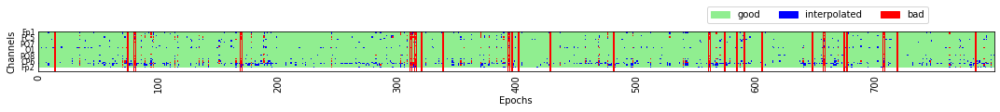

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[7_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: -1.235022431921706
[7_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -1.0140449100175222
[7_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -1.4129935703387848
[7_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: -1.4634703685137103
[7_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -0.7699861531007228
[7_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -1.212632576166227
[7_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -2.1673447313853695
[7_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: -1.7448055394827124
Perf: good, Mean: -1.3963367216866458
[-1.235022431921706, -0.769986153100

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: No coordinate information found for channels ['HEOG', 'VEOG', 'StimTrak']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = read_raw_brainvision(filepath, preload=True)
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (250.00 Hz, Nyqui

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 16501 samples (33.002 sec)



/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3613157478.py:67: RuntimeWarning: Not setting positions of 3 misc channels found in montage:
['HEOG', 'VEOG', 'StimTrak']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_brainvision(filepath, preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 90', 'Stimulus/S 91', 'Stimulus/S100', 'Stimulus/S101', 'Stimulus/S102', 'Stimulus/S103', 'Stimulus/S104', 'Stimulus/S105', 'Stimulus/S106']
====================== EPOCHING ======================
tmin:-0.4, tmax:1.45, baseline=(-0.4, 0)
Not setting metadata
Not setting metadata
800 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 800 events and 926 original time points ...
0 bad epochs dropped
A total of 800 epochs were extracted and baseline corrected.
Running autoreject on ch_type=eeg


/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/31 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/31 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/800 [00:00<?,       ?it/s]

Dropped 102 epochs: 26, 38, 43, 53, 54, 61, 82, 103, 106, 111, 126, 134, 137, 138, 140, 142, 146, 147, 148, 150, 154, 156, 173, 174, 188, 192, 206, 218, 233, 234, 275, 296, 300, 305, 314, 319, 322, 326, 330, 332, 336, 337, 342, 344, 346, 351, 354, 355, 365, 383, 387, 394, 395, 396, 397, 423, 431, 436, 442, 452, 455, 468, 477, 495, 503, 507, 515, 519, 520, 522, 526, 530, 557, 579, 580, 584, 609, 634, 642, 668, 675, 682, 684, 689, 699, 701, 709, 713, 716, 719, 726, 727, 730, 731, 744, 748, 760, 763, 764, 788, 792, 794


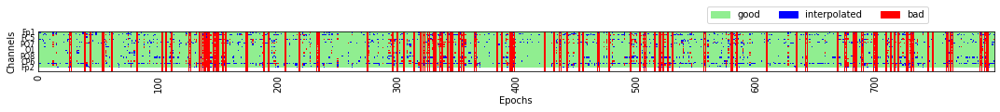

---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
[8_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-good: 0.11666092674806794
[8_KiNi4.vhdr] Adding Mean CDA Amp for 2-left-bad: -0.21448753049640526
[8_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-good: -0.2228346671380796
[8_KiNi4.vhdr] Adding Mean CDA Amp for 2-right-bad: 0.9582278534480538
[8_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-good: -0.7737579391393048
[8_KiNi4.vhdr] Adding Mean CDA Amp for 4-left-bad: -0.06783969970773202
[8_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-good: -0.11373404040821468
[8_KiNi4.vhdr] Adding Mean CDA Amp for 4-right-bad: 0.42048675805373975
Perf: good, Mean: -0.24841642998438276
[0.11666092674806794, -0.773757

,2,4,left,right,good,bad,2-left,2-left-CDA,2-left-good,2-left-good-CDA,...,4-right-good,4-right-good-CDA,right-good-CDA,4-right-bad,4-right-bad-CDA,right-bad-CDA,checksum,notes,good-CDA,bad-CDA
10_WM_att_NHKA.vhdr,400,400,400,400,571,229,200,0,154,0.128999,...,128,-2.798799,-2.739659,72,-0.26822,-1.969065,0,,-1.382124,-0.574761
11_WM_att_NHKA.vhdr,400,400,400,400,665,135,200,0,190,-1.115093,...,154,0.100221,0.17646,46,0.001144,-0.145194,0,0,-0.507816,-0.866036
12_WM_att_NHKA.vhdr,400,400,400,400,723,77,200,0,192,-1.472158,...,168,-0.6353,-0.414582,32,-0.401453,-0.196949,0,0,-0.907677,-1.08341
13_WM_att_NHKA.vhdr,400,400,400,400,620,180,200,0,169,-0.964799,...,136,0.248419,0.410485,64,0.941454,0.930942,0,0,-0.290321,0.394265
15_WM_att_NHKA.vhdr,400,400,400,400,484,316,200,0,140,0.081119,...,103,-0.271684,-0.712456,97,-1.006667,-0.76693,0,0,-0.245041,-0.107027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5_KiNi4.vhdr,400,400,400,400,662,138,200,0,174,-1.737185,...,153,0.237227,0.481284,47,0.155014,0.494751,1,0,-0.566584,-0.465341
50_KiNi4.vhdr,400,400,400,400,646,154,200,0,175,-2.61551,...,152,-0.927799,-0.361573,48,-0.801097,-0.787039,0,0,-1.533062,-1.588406
6_KiNi4.vhdr,400,400,400,400,598,202,200,0,163,-0.416786,...,138,-0.407962,-0.284546,62,-0.61427,-0.534356,0,0,-0.163504,-0.287411
7_KiNi4.vhdr,400,400,400,400,421,379,200,0,112,-1.235022,...,91,-2.167345,-1.790169,109,-1.744806,-1.604138,0,0,-1.396337,-1.358738


In [2]:
#==================================================================
# General Variables
#==================================================================
study_id = 'Hakim2019'

triggers = dict();

triggers['2'] = [2, 3]
triggers['4'] = [4, 5]

triggers['left'] = [3, 5]   #[2, 4]
triggers['right'] = [2, 4]  #[3, 5]

triggers['good'] = [91]
triggers['bad'] = [90]

# Labels
conds = ['2', '4']
sides = ['left', 'right']
perfs = ['good', 'bad']

# Internal Triggers to Epochs Properly
internal_triggers = dict()
internal_triggers_count = 0
for cond in conds:
    for side in sides:
        for perf in perfs:
            internal_triggers_count = internal_triggers_count + 1
            internal_triggers['{}-{}-{}'.format(cond,side,perf)] = internal_triggers_count
            
# CDA Channels
chan_right = ['O2', 'PO4', 'PO8', 'P4', 'P8']
chan_left = ['O1', 'PO3', 'PO7', 'P3', 'P7']

# Epoch Information
epoch_length = 1.45
epoch_tmin = -0.4
baseline_corr = (-0.4, 0)

# CDA info
cda_window = (0.4, 1.45)

# CDA main variable!
cda_dict_all = dict()
epochs_dict_all = dict()
perf_report_all = dict()
report = prep_report(conds, sides, perfs)

#==================================================================
# Main Loop - Loading All Files & Extract CDAs.
#==================================================================
experiences = ['Exp1a', 'Exp1b', 'Exp2a', 'Exp2b'] 

eegfiles = []
for cur_exp in experiences:
    folderpath = '/Volumes/Nick - Data/CDA Datasets/Hakim 2019/{}/EEGData/**/*.vhdr'.format(cur_exp)
    for filepath in glob.glob(folderpath, recursive=True):
        eegfiles.append(filepath)

for filepath in eegfiles:
    filename = filepath[filepath.rfind('/')+1:]
    print('Processing: ' + filename + '...')
   
    # ------------------------
    # 1. -- Load File --
    # ------------------------
    raw = read_raw_brainvision(filepath, preload=True)

    # ------------------------
    # 2. -- Preprocessing --
    # ------------------------
    # Set Electrodes Locations - Used Brain Products (locations seem to in eeg file...)
    montage = mne.channels.make_standard_montage('standard_1020')
    raw.set_montage(montage)
    
    preproc = raw
    
    # Filter
    preproc = preproc.filter(.1, 20., fir_design='firwin', skip_by_annotation='edge')

    # Events
    events = mne.events_from_annotations(preproc)
        
    # Select Channels (to save time on cleaning)
    #preproc = preproc.pick_channels(chan_right + chan_left)
    
    # Plot (visual check)
    #preproc.plot(events=events, block=True, lowpass=40)
    
    # ------------------------
    # 3. -- Epochs --
    # ------------------------    
    specific_events = get_specific_events(events[0], conds, sides, perfs, triggers, internal_triggers)

    epochs_dict = get_epochs(preproc, specific_events, epoch_length, epoch_tmin, baseline_corr, clean=True)

    epochs_dict_all[filename] = epochs_dict
    
    # times, used for CDA mean amp report.
    times = epochs_dict[conds[0]][sides[0]][perfs[0]].times
    
    # ------------------------
    # 4. -- CDA --
    # ------------------------
    cda_dict_all[filename] = get_CDA(epochs_dict, conds, sides, perfs, chan_right, chan_left)
    
    # ------------------------
    # 6. - Report & Checksum -
    # ------------------------
    report = fill_report(report, filename, specific_events)
    report = add_cda_report(report, filename, conds, sides, perfs, cda_dict_all[filename], times, cda_window=cda_window)
    report.at[filename, 'checksum'] = checksum(specific_events, epochs_dict)
    
    perf_report_all[filename] = get_CDA_perf_report(epochs_dict, conds, sides, perfs, chan_right, chan_left, cda_window=cda_window)

# Print report
print('{} Subjects & {} Trials'.format(len(report), 2*np.sum([report[cond].sum() for cond in conds])))
report

## 2. Plot Grand CDA Average

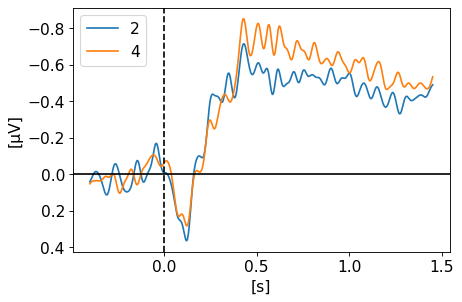

In [5]:
cda_all = dict()

# Get CDA GA
for cond in cda_dict_all[list(cda_dict_all.keys())[0]].keys():
    cda_all[cond] = dict()

    for f in cda_dict_all.keys():        
        perf = 'good'
        
        ldict = cda_dict_all[f][cond]['left']
        rdict = cda_dict_all[f][cond]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
            cda_dict_cur = (cda_dict_all[f][cond]['left'][perf] + cda_dict_all[f][cond]['right'][perf])/2            
            cda_all[cond] = np.vstack([cda_all[cond], cda_dict_cur]) if len(cda_all[cond]) else cda_dict_cur
        else:
            print("==== SKIPPED: 0 points! (File: {} - Cond: {})".format(str(f), str(cond)))
            
# Plot
plt.rcParams.update({'font.size': 14})

# 2. Plot Figure
fig = plt.figure(figsize=(6, 4), dpi=80)
plt.plot(times, cda_all['2'].mean(0) * 1e6, label='2')
plt.plot(times, cda_all['4'].mean(0) * 1e6, label='4')
plt.axvline(x=0, color='k', linestyle='--')
plt.axhline(y=0, color='k', linestyle='-')
plt.gca().invert_yaxis()
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[s]')

plt.tight_layout()
fig.savefig("./{}-reprod.png".format(study_id), dpi=300, format='png')

## Save CDA Data

In [6]:
data_pickle = dict()
data_pickle['times'] = times
data_pickle['CDA'] = cda_dict_all
data_pickle['epochs'] = epochs_dict_all
data_pickle['report'] = report
data_pickle['report_perf'] = perf_report_all

with open("{}_clean-20hz.pkl".format(study_id),"wb") as f:
    pickle.dump(data_pickle, f)

## Load CDA Data

In [3]:
with open("{}_clean-20hz.pkl".format(study_id),"rb") as f:
    data_pickle = pickle.load(f)
    
times = data_pickle['times']
cda_dict_all = data_pickle['CDA']
epochs_dict_all = data_pickle['epochs']
report = data_pickle['report']
perf_report_all = data_pickle['report_perf']

len(cda_dict_all)

96

## Analysis - Bad Perf Trials

Text(0.5, 0, '[s]')

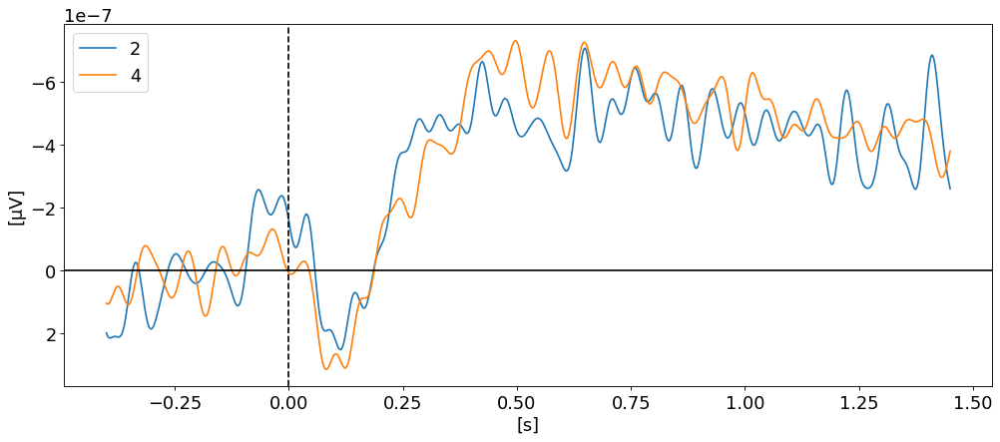

In [15]:
cda_all_bad = dict()

for cond in cda_dict_all[list(cda_dict_all.keys())[0]].keys():
    cda_all_bad[cond] = dict()

    for f in cda_dict_all.keys():
        perf = 'bad'
        
        ldict = cda_dict_all[f][cond]['left']
        rdict = cda_dict_all[f][cond]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
            cda_dict_cur = (cda_dict_all[f][cond]['left'][perf] + cda_dict_all[f][cond]['right'][perf])/2
            if ~np.isnan(cda_dict_cur[0]):
                cda_all_bad[cond] = np.vstack([cda_all_bad[cond], cda_dict_cur]) if len(cda_all_bad[cond]) else cda_dict_cur
        elif (perf in ldict.keys() and len(ldict[perf])):
            cda_dict_cur = cda_dict_all[f][cond]['left'][perf]
            if ~np.isnan(cda_dict_cur[0]):
                cda_all_bad[cond] = np.vstack([cda_all_bad[cond], cda_dict_cur]) if len(cda_all_bad[cond]) else cda_dict_cur
        elif (perf in rdict.keys() and len(rdict[perf])):
            cda_dict_cur = cda_dict_all[f][cond]['right'][perf]
            if ~np.isnan(cda_dict_cur[0]):
                cda_all_bad[cond] = np.vstack([cda_all_bad[cond], cda_dict_cur]) if len(cda_all_bad[cond]) else cda_dict_cur            
        else:
            print("==== SKIPPED: 0 points! (File: {} - Cond: {})".format(str(f), str(cond)))

# Plot
plt.rcParams.update({'font.size': 16})

# 2. Plot Figure
plt.figure(figsize=(15, 6), dpi=80)
plt.plot(times, cda_all_bad['2'].mean(0), label='2')
plt.plot(times, cda_all_bad['4'].mean(0), label='4')
plt.axvline(x=0, color='k', linestyle='--')
plt.axhline(y=0, color='k', linestyle='-')
plt.gca().invert_yaxis()
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[s]')

#plt.savefig("./{}-bad.png".format(study_id), dpi=300, format='png')

## Analysis - Show Spread per subject

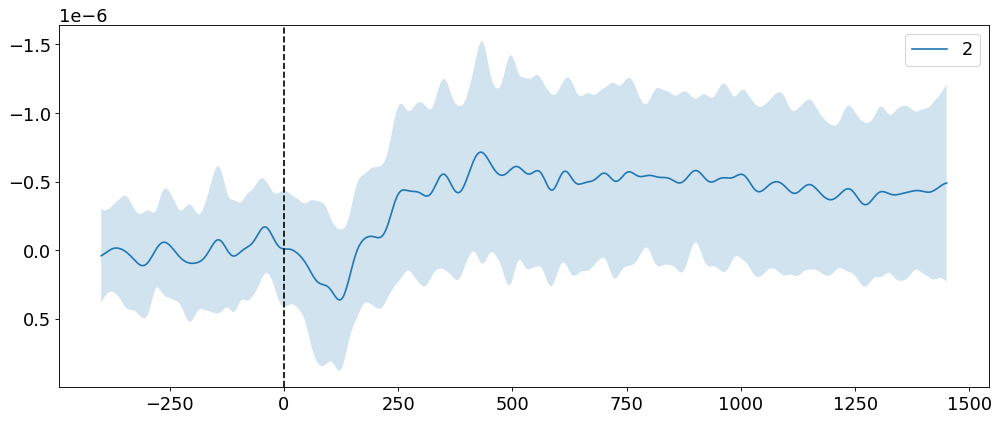

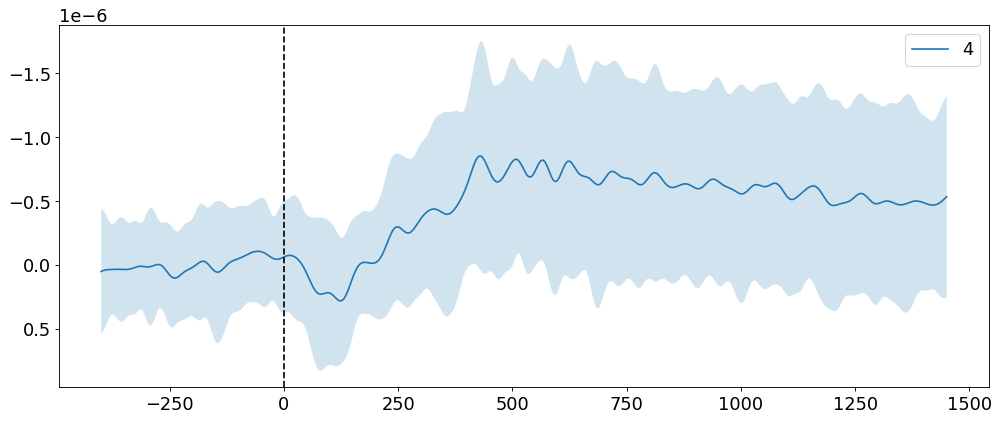

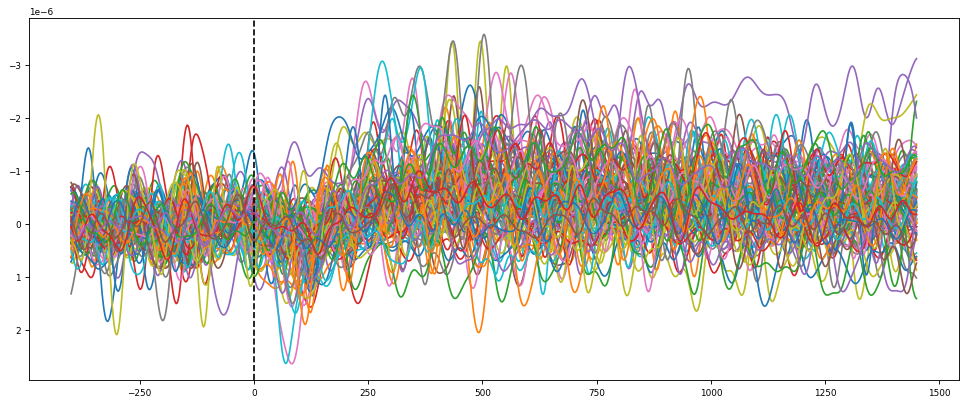

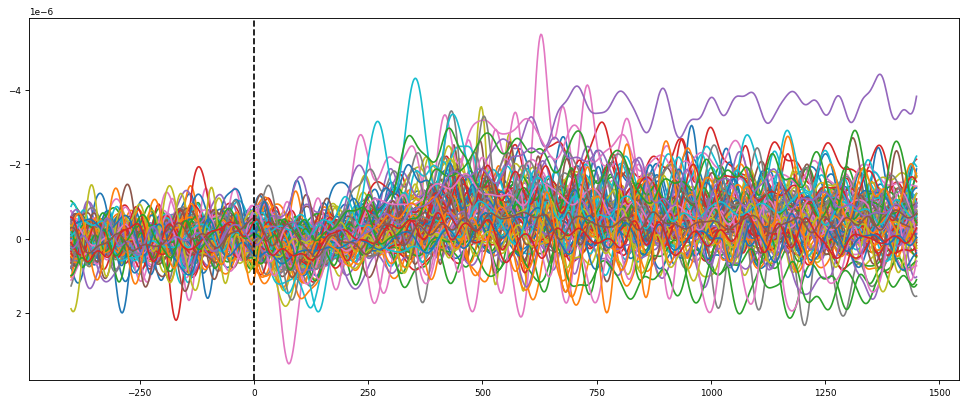

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_3439/3006165059.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, len(conds), figsize=(15,6))


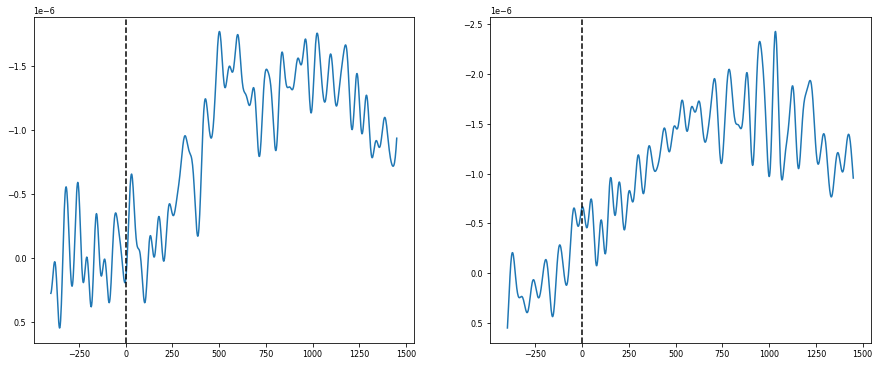

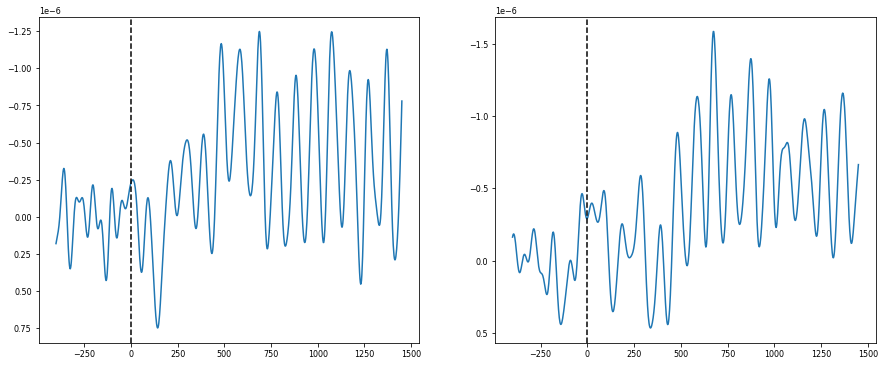

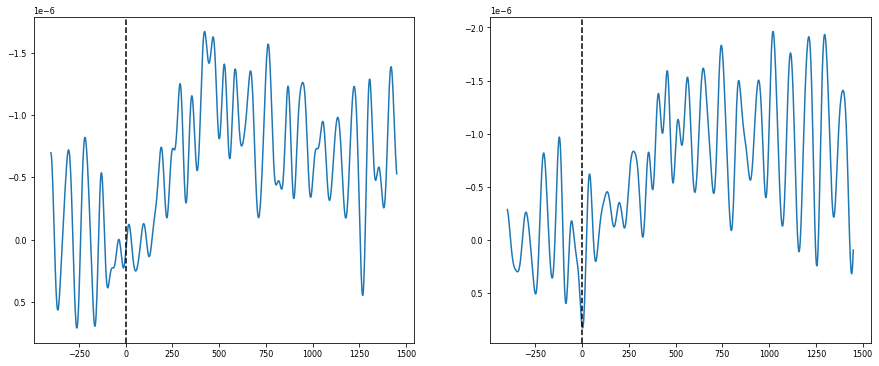

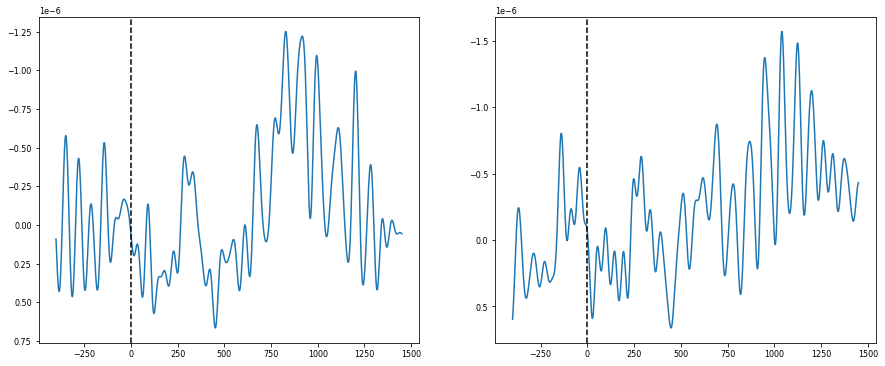

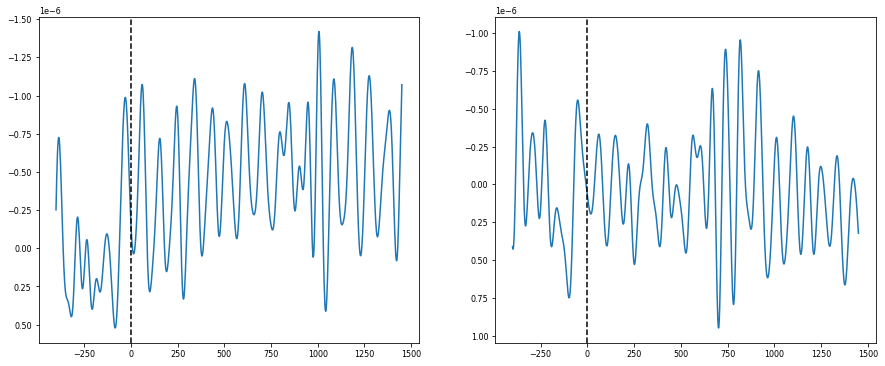

...

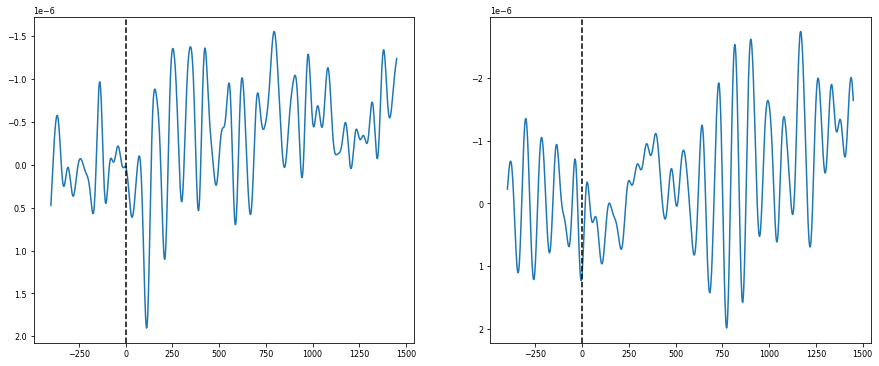

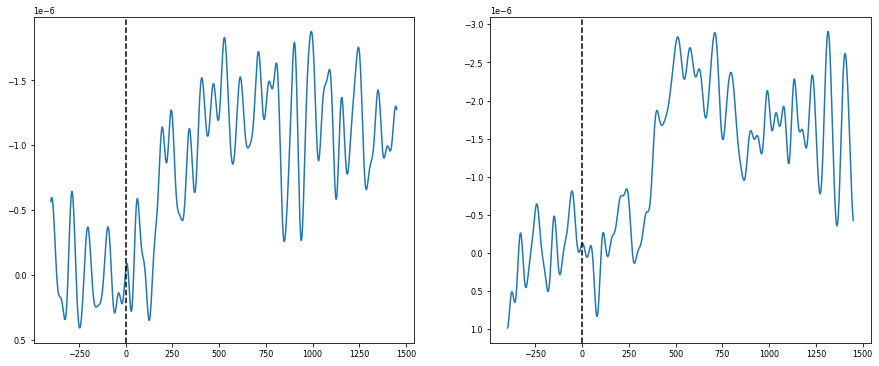

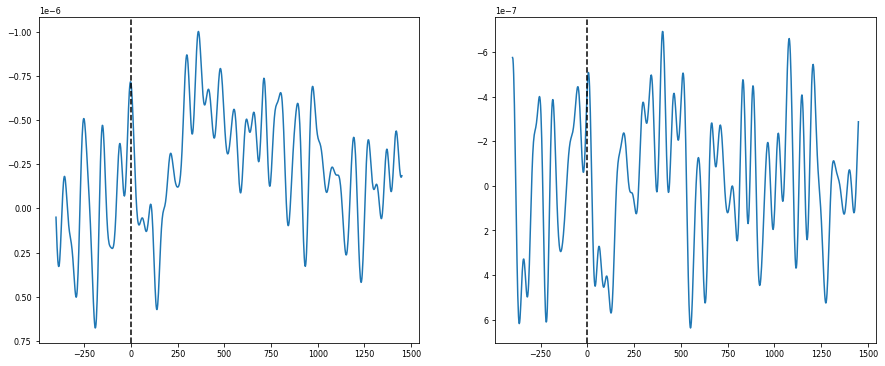

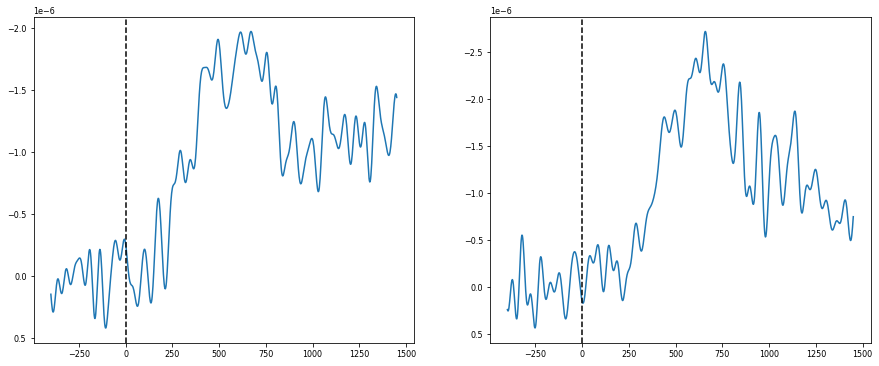

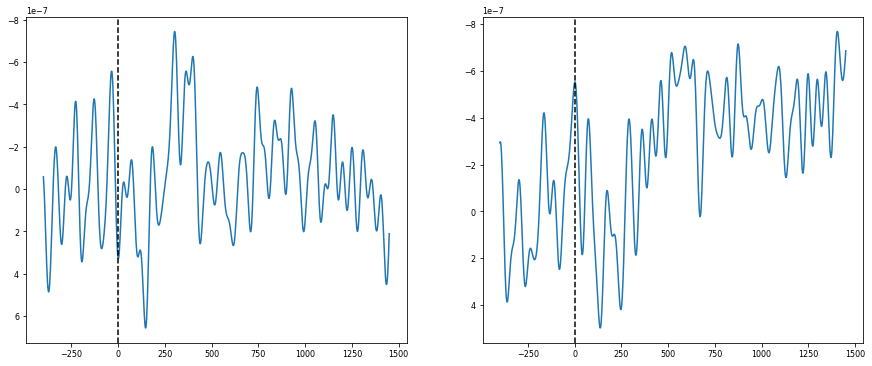

In [16]:
plt.rcParams.update({'font.size': 16})
for cond in conds:
    plt.figure(figsize=(15, 6), dpi=80)
    means = cda_all[cond].mean(0)
    stds = cda_all[cond].std(0)
    plt.plot((times * 1000), means, label=cond)
    plt.fill_between((times * 1000), means-stds,means+stds,alpha=.2)

    plt.axvline(x=0, color='k', linestyle='--')
    plt.gca().invert_yaxis()
    plt.legend()
    plt.show()

plt.rcParams.update({'font.size': 8})
for cond in conds:
    plt.figure(figsize=(15, 6), dpi=80)
    for i in range(len(cda_all[cond])):
        plt.plot((times * 1000), cda_all[cond][i,:], label='{}'.format(i))

    plt.axvline(x=0, color='k', linestyle='--')
    plt.gca().invert_yaxis()
    #plt.legend()
    plt.show()

plt.rcParams.update({'font.size': 8})
#plt.figure(figsize=(15, 6), dpi=80)
for subject in range(len(cda_all[conds[0]])):
    fig, axs = plt.subplots(1, len(conds), figsize=(15,6))
    for i, cond in enumerate(conds):
        axs[i].plot((times * 1000), cda_all[cond][subject,:], label='{}'.format(i))
        axs[i].axvline(x=0, color='k', linestyle='--')
        axs[i].invert_yaxis()
    
#plt.gca().invert_yaxis()
#plt.legend()
plt.show()

## Analysis - Performance Report (CDA per Subject)

In [10]:
report = report.loc[:,~report.columns.duplicated()]

## Subjects: Perf (Good/Bad) vs CDA Amp

Text(0, 0.5, 'Mean CDA Amplitude')

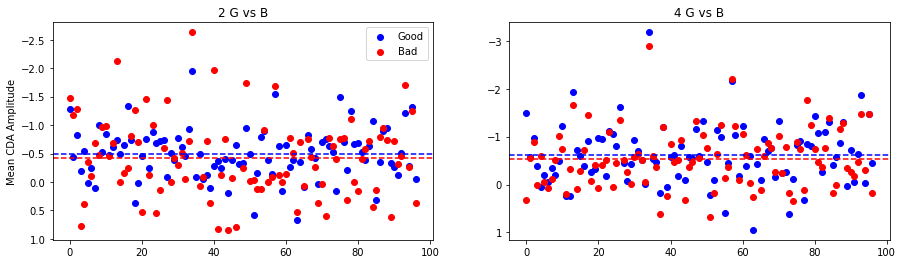

In [11]:
plt.rcParams.update({'font.size': 10})

fig, axs = plt.subplots(1, len(conds), figsize=(15,4))

for i, cond in enumerate(conds):
    x = range(len(report['{}-right-good-CDA'.format(cond)]))
    
    # Good
    y = (report['{}-right-good-CDA'.format(cond)] + report['{}-left-good-CDA'.format(cond)]) / 2
    axs[i].scatter(x=x, y=y, color='blue', label='Good')
    axs[i].axhline(y=np.nanmean(y), color='blue', linestyle='--')
    # Bad
    y = (report['{}-right-bad-CDA'.format(cond)] + report['{}-left-bad-CDA'.format(cond)]) / 2
    axs[i].scatter(x=x, y=y, color='red', label='Bad')
    axs[i].axhline(y=np.nanmean(y), color='red', linestyle='--')
    
    axs[i].set_title('{} G vs B'.format(cond))
    axs[i].invert_yaxis()
    
axs[0].legend()
axs[0].set_ylabel('Mean CDA Amplitude')
    

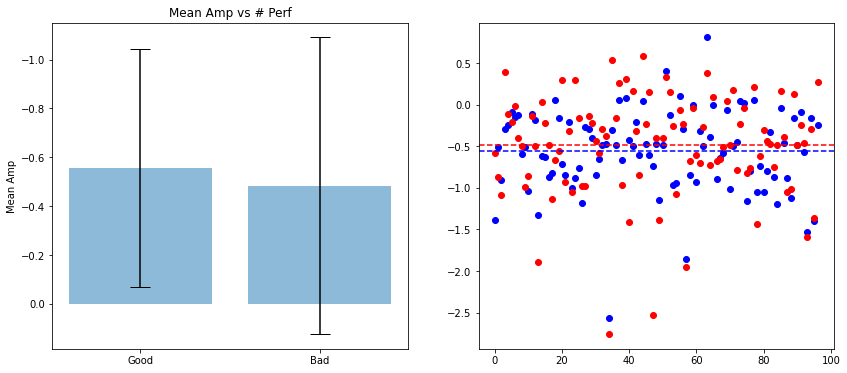

Corr Perf vs CDA Amp: (0.0660975125407016, 0.3598326179770273)


In [12]:
fig, axs = plt.subplots(1, 2, figsize=(14,6))

# Data
goods = np.array(report['good-CDA'])
bads = np.array(report['bad-CDA'])

# Calculate the average
goods_mean = np.nanmean(goods)
bads_mean = np.nanmean(bads)

# Calculate the standard deviation
goods_std = np.nanstd(goods)
bads_std = np.nanstd(bads)

# Define labels, positions, bar heights and error bar heights
labels = ['Good', 'Bad']
x_pos = np.arange(len(labels))
CTEs = [goods_mean, bads_mean]
error = [goods_std, bads_std]

# Build the plot
axs[0].bar(x_pos, CTEs,
       yerr=error,
       align='center',
       alpha=0.5,
       ecolor='black',
       capsize=10)
axs[0].set_ylabel('Mean Amp')
axs[0].set_xticks(x_pos)
axs[0].set_xticklabels(labels)
axs[0].set_title('Mean Amp vs # Perf')
axs[0].invert_yaxis()
#ax.yaxis.grid(True)

x = range(len(report['good-CDA']))
axs[1].scatter(x=x, y=report['good-CDA'], color='blue')
axs[1].axhline(y=np.nanmean(report['good-CDA']), color='blue', linestyle='--')
axs[1].scatter(x=x, y=report['bad-CDA'], color='red')
axs[1].axhline(y=np.nanmean(report['bad-CDA']), color='red', linestyle='--')

#plt.tight_layout()
plt.show()

import scipy
x = []
y = []
for p in perfs:
    for value in report['{}-CDA'.format(p)]:
        if p == 'good':
            x.append(1)
        else:
            x.append(2)
        y.append(value)

print('Corr Perf vs CDA Amp: {}'.format(scipy.stats.pearsonr(x,y)))

## Subjects: Condition vs CDA Amp

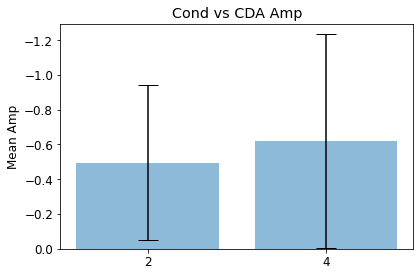

In [13]:
plt.rcParams.update({'font.size': 12})

data_conds = dict()
for cond in conds:
    data_conds[cond] = dict()
    data_conds[cond]['data'] = np.array(report['{}-good-CDA'.format(cond)])
    data_conds[cond]['mean'] = np.nanmean(data_conds[cond]['data'])
    data_conds[cond]['std'] = np.nanstd(data_conds[cond]['data'])
    
labels = conds
x_pos = np.arange(len(labels))
CTEs = [data_conds[cond]['mean'] for cond in conds]
error = [data_conds[cond]['std'] for cond in conds]

fig, ax = plt.subplots()
ax.bar(x_pos, CTEs, yerr=error, align='center', alpha=0.5, ecolor='black', capsize=10)
ax.set_ylabel('Mean Amp')
ax.set_xticks(x_pos)
ax.set_xticklabels(labels)
ax.set_title('Cond vs CDA Amp')
ax.invert_yaxis()
#ax.yaxis.grid(True)
plt.tight_layout()
plt.show()

In [18]:
# Pearson's Correlation
import scipy
x = []
y = []
for i, ss in enumerate(['2', '4']):
    for value in report['{}-good-CDA'.format(ss)]:
        x.append(i)
        y.append(value)

print('Corr 2 & 4 vs CDA Amp: {}'.format(scipy.stats.pearsonr(x,y)))

Corr 2 & 4 vs CDA Amp: (-0.11361851500556955, 0.11470167108077514)


## Subjects: Side (Left/Right) vs CDA Amp

Corr Side vs CDA Amp: (0.08061039633595114, 0.26385053998932817)


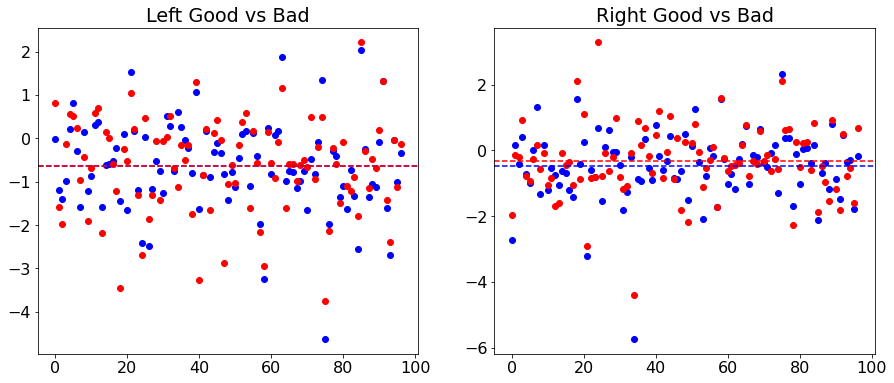

In [19]:
plt.rcParams.update({'font.size': 16})

fig, axs = plt.subplots(1, 2, figsize=(15,6))

x = range(len(report['left-good-CDA']))
y= report['left-good-CDA']
axs[0].scatter(x=x, y=y, color='blue')
axs[0].axhline(y=np.nanmean(y), color='blue', linestyle='--')
x = range(len(report['left-bad-CDA']))
y= report['left-bad-CDA']
axs[0].scatter(x=x, y=y, color='red')
axs[0].axhline(y=np.nanmean(y), color='red', linestyle='--')
axs[0].set_title('Left Good vs Bad')

x = range(len(report['right-good-CDA']))
y= report['right-good-CDA']
axs[1].scatter(x=x, y=y, color='blue')
axs[1].axhline(y=np.nanmean(y), color='blue', linestyle='--')
x = range(len(report['right-bad-CDA']))
y= report['right-bad-CDA']
axs[1].scatter(x=x, y=y, color='red')
axs[1].axhline(y=np.nanmean(y), color='red', linestyle='--')
axs[1].set_title('Right Good vs Bad')

x = []
y = []
for i, side in enumerate(sides):
    for value in report['{}-good-CDA'.format(side)]:
        x.append(i)
        y.append(value)

print('Corr Side vs CDA Amp: {}'.format(scipy.stats.pearsonr(x,y)))

## Subjects: Accuracy / Performance vs CDA Amp

Corr Perf Acc ~ 2: (-0.0740776115948566, 0.4708397067792359)
Corr Perf Acc ~ 4: (-0.30461275097631735, 0.002416257951200916)


Text(0, 0.5, 'CDA Mean Amp')

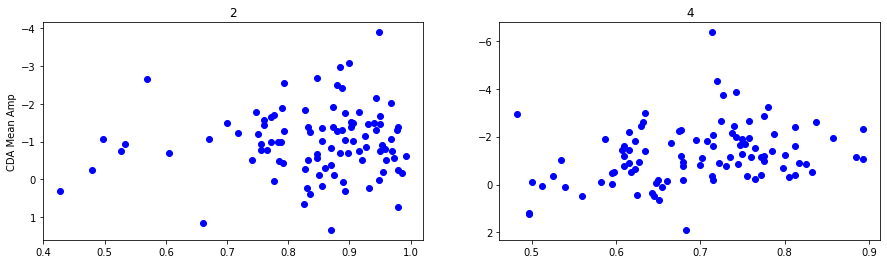

In [20]:
plt.rcParams.update({'font.size': 10})

fig, axs = plt.subplots(1, len(conds), figsize=(15,4))

for i, cond in enumerate(conds):
    goods = (report['{}-left-good'.format(cond)] + report['{}-right-good'.format(cond)])/2
    bads = (report['{}-left-bad'.format(cond)] + report['{}-right-bad'.format(cond)])/2
    x = goods / (goods + bads)
    y = report['{}-left-good-CDA'.format(cond)] + report['{}-right-good-CDA'.format(cond)]
    axs[i].scatter(x=x, y=y, color='blue')
    axs[i].invert_yaxis()
    axs[i].set_title('{}'.format(cond))
    
    print('Corr Perf Acc ~ {}: {}'.format(cond, scipy.stats.pearsonr(x,y)))

axs[0].set_ylabel('CDA Mean Amp')

## Trials: Conditions vs Amp

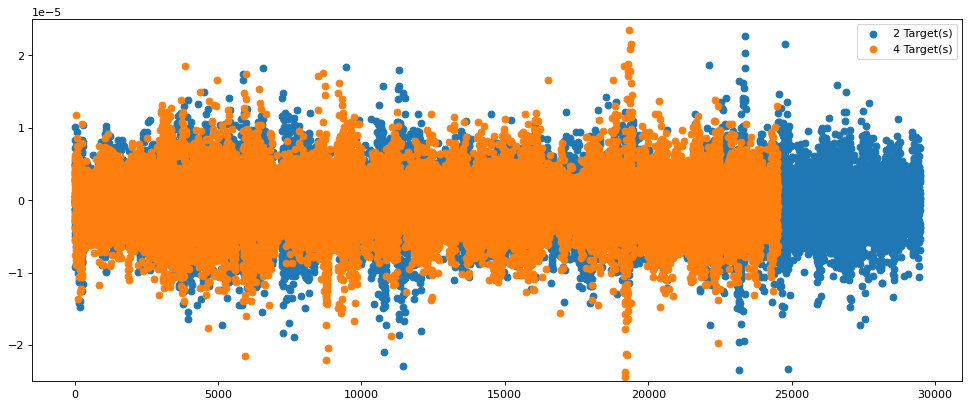

In [21]:
plt.figure(figsize=(15, 6), dpi=80)

for i, cond in enumerate(conds):
    y1 = []
    for f in perf_report_all.keys():
        for side in sides:
            for value in perf_report_all[f][cond][side]['good']:
                y1.append(value)
    x1 = range(len(y1))

    plt.scatter(x=x1, y=y1, label='{} Target(s)'.format(cond))

plt.ylim(-2.5*1e-5,2.5*1e-5)
plt.legend()
plt.show()

## Trials: Good vs Bad

Cond = 2 Targets: 29476 Good Perf Trials vs 5637 Bad Perf Trials, with 5 outliers on graph.
Cond = 4 Targets: 24511 Good Perf Trials vs 10732 Bad Perf Trials, with 3 outliers on graph.


Text(0, 0.5, 'CDA mean amplitude')

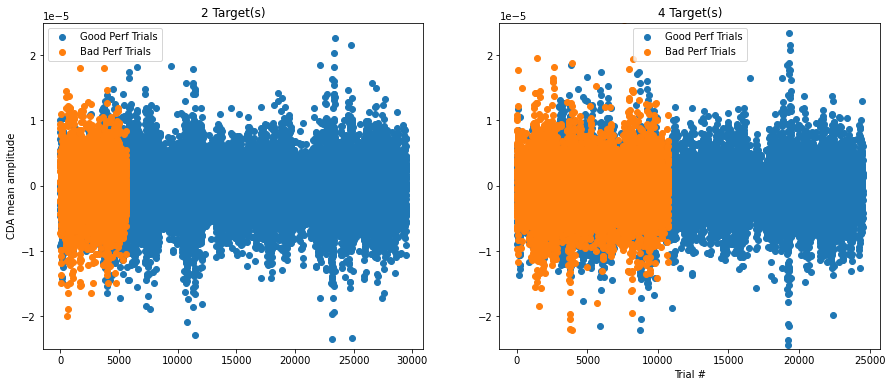

In [22]:
plt.rcParams.update({'font.size': 10})

fig, axs = plt.subplots(1, len(conds), figsize=(15,6))

for i, cond in enumerate(conds):
    y1 = []
    for f in perf_report_all.keys():
        for value in perf_report_all[f][cond]['left']['good']:
            y1.append(value)
        for value in perf_report_all[f][cond]['right']['good']:
            y1.append(value)
    x1 = range(len(y1))

    y2 = []
    for f in perf_report_all.keys():
        if 'bad' in perf_report_all[f][cond]['left'].keys():
            for value in perf_report_all[f][cond]['left']['bad']:
                y2.append(value)
        if 'bad' in perf_report_all[f][cond]['right'].keys():
            for value in perf_report_all[f][cond]['right']['bad']:
                y2.append(value)
    x2 = range(len(y2))

    axs[i].scatter(x=x1, y=y1, label='Good Perf Trials')
    axs[i].scatter(x=x2, y=y2, label='Bad Perf Trials')
    axs[i].legend()
    axs[i].set_ylim(-2.5*1e-5,2.5*1e-5)
    axs[i].set_title('{} Target(s)'.format(cond))

    nb_outliers = len([val for val in (y1 + y2) if ((val*1e5) > 2.5) or ((val*1e5) < -2.5)])
    print('Cond = {} Targets: {} Good Perf Trials vs {} Bad Perf Trials, with {} outliers on graph.'.format(cond, len(y1), len(y2), nb_outliers))

axs[1].set_xlabel('Trial #')
axs[0].set_ylabel('CDA mean amplitude')
#fig.tight_layout(pad=1.0)

## Trials: Left vs Right

Cond = 2 Targets: 14607 Good Left Trials vs 14869 Good Right Trials, with 4 outliers on graph
Cond = 4 Targets: 12335 Good Left Trials vs 12176 Good Right Trials, with 2 outliers on graph


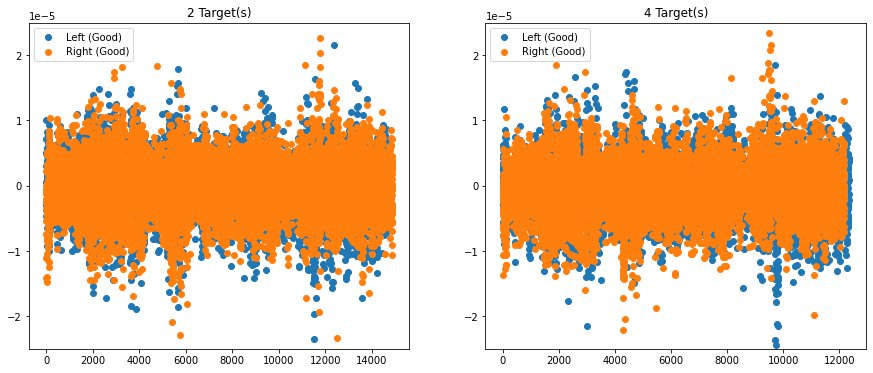

In [23]:
fig, axs = plt.subplots(1, len(conds), figsize=(15,6))

for i, cond in enumerate(conds):
    y1 = []
    for f in perf_report_all.keys():
        for value in perf_report_all[f][cond]['left']['good']:
            y1.append(value)
    x1 = range(len(y1))

    y2 = []
    for f in perf_report_all.keys():
        for value in perf_report_all[f][cond]['right']['good']:
            y2.append(value)
    x2 = range(len(y2))

    axs[i].scatter(x=x1, y=y1, label='Left (Good)')
    axs[i].scatter(x=x2, y=y2, label='Right (Good)')
    axs[i].legend()
    axs[i].set_title('{} Target(s)'.format(cond))
    axs[i].set_ylim(-2.5*1e-5,2.5*1e-5)

    nb_outliers = len([val for val in (y1 + y2) if ((val*1e5) > 2.5) or ((val*1e5) < -2.5)])
    print('Cond = {} Targets: {} Good Left Trials vs {} Good Right Trials, with {} outliers on graph'.format(cond, len(y1), len(y2), nb_outliers))
        